In [0]:
import numpy as np
import pandas as pd
import plotly as px
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from datetime import datetime
import time

import pyspark.sql.functions as f
import pyspark.sql.types as t
from pyspark.sql.functions import isnan, when, count, col

from pyspark.ml.feature import StringIndexer, VectorIndexer, VectorAssembler, StandardScaler, OneHotEncoder, SQLTransformer
from pyspark.ml.classification import LogisticRegression 
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml import Pipeline
from pyspark.sql import Window

from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

import mlflow
import mlflow.spark

### Goal 
Try out some tree based algorithms, **DecionsTree and RandomForest** on our **6 month** then **ALL** data and see how we can extend this setup to our final dataset.

In [0]:
data = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/final_datasets/data_range/part-00*.parquet")

In [0]:
print(data.count())
len(data.columns)
np.array(data.columns)

24603731
Out[4]: array(['YEAR', 'QUARTER', 'MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK',
 'FL_DATE', 'OP_UNIQUE_CARRIER', 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER', 'TAIL_NUM', 'OP_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID', 'ORIGIN_CITY_MARKET_ID', 'ORIGIN',
 'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR', 'ORIGIN_STATE_FIPS',
 'ORIGIN_STATE_NM', 'ORIGIN_WAC', 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID', 'DEST_CITY_MARKET_ID', 'DEST',
 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'DEST_STATE_FIPS',
 'DEST_STATE_NM', 'DEST_WAC', 'CRS_DEP_TIME', 'DEP_TIME',
 'DEP_DELAY', 'DEP_DELAY_NEW', 'DEP_DEL15', 'DEP_DELAY_GROUP',
 'DEP_TIME_BLK', 'TAXI_OUT', 'WHEELS_OFF', 'WHEELS_ON', 'TAXI_IN',
 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY', 'ARR_DELAY_NEW',
 'ARR_DEL15', 'ARR_DELAY_GROUP', 'ARR_TIME_BLK', 'CANCELLED',
 'DIVERTED', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME',
 'FLIGHTS', 'DISTANCE', 'DISTANCE_GROUP', 'DIV_AIRPORT_LANDINGS',
 'ORIGIN_TZ', 'DEST_TZ', 'DEP_MIN', 'DEP_HOUR', 'ARR_MIN',
 'ARR_HOUR', 'ORIGIN_TS', 'ORIGIN_UTC', 'DEST_TS', 'DEST_UTC',
 'ORIGIN_FLIGHT_COUNT', 'DEST_FLIGHT_COUNT', 'ORIGIN_STATION',
 'ORIGIN_STATION_NAME', 'PAGERANK', 'DEST_STATION',
 'DEST_STATION_NAME', 'ORIGIN_UTC_ADJ_MIN', 'ORIGIN_UTC_ADJ_MAX',
 'ORIGIN_MAX_DATE', 'DEST_MAX_DATE', 'AVG_WND_SPEED_ORIGIN',
 'MIN_CIG_HEIGHT_ORIGIN', 'MIN_VIS_DIS_ORIGIN',
 'AVG_TMP_DEG_ORIGIN', 'AVG_DEW_DEG_ORIGIN', 'AVG_SLP_ORIGIN',
 'AVG_WND_SPEED_DEST', 'MIN_CIG_HEIGHT_DEST', 'MIN_VIS_DIS_DEST',
 'AVG_TMP_DEG_DEST', 'AVG_DEW_DEG_DEST', 'AVG_SLP_DEST'],
 dtype='<U21')

#### Data Sanity

In [0]:
data.groupBy('DEP_DEL15').count().orderBy('count').show()

+---------+--------+
DEP_DEL15| count|
+---------+--------+
 1.0| 4444482|
 0.0|20159249|
+---------+--------+

In [0]:
year_delay = data.groupBy('YEAR','DEP_DEL15').count().orderBy('count')
year_delay.show()

+----+---------+-------+
YEAR|DEP_DEL15| count|
+----+---------+-------+
2019| 1.0| 229494|
2016| 1.0| 924942|
2019| 0.0| 947554|
2017| 1.0| 990761|
2015| 1.0|1026904|
2018| 1.0|1272381|
2016| 0.0|4486796|
2017| 0.0|4499142|
2015| 0.0|4563337|
2018| 0.0|5662420|
+----+---------+-------+

#### Select Needed 6 month Data

In [0]:
data_6 = data.where(col("YEAR") == 2015) \
             .where((col("ORIGIN") == "ORD") | (col("ORIGIN") == "ATL")) \
             .where(col("MONTH").isin([1,2,3,4,5,6]))

In [0]:
print("Number of columns: ",len(data_6.columns))

Number of columns: 89

In [0]:
og_cols = data_6.columns

In [0]:
columns_to_drop = ["YEAR", 'QUARTER' 'OP_CARRIER', "OP_CARRIER_FL_NUM", "ORIGIN_AIRPORT_ID", 
                   "FL_DATE", "OP_CARRIER_AIRLINE_ID", "DEST_STATE_FIPS", "ARR_TIME_BLK", "DEP_TIME_BLK","DISTANCE_GROUP",
                   "ORIGIN_AIRPORT_SEQ_ID", "ORIGIN_CITY_NAME", "ORIGIN_STATE_FIPS", "ORIGIN_STATE_NM",
                   "ORIGIN_WAC", 'DEST_AIRPORT_ID','DEST_AIRPORT_SEQ_ID',"DEST_CITY_NAME", "DEST_STATE_FIPS",
                   'DEST_STATE_NM', 'DEST_WAC', 'CRS_DEP_TIME', 'CRS_ARR_TIME', 'DEP_TIME', 'ARR_TIME', "CANCELLED", "DIVERTED", 
                   "ACTUAL_ELAPSED_TIME", "FLIGHTS", "DIV_AIRPORT_LANDINGS", "ORIGIN_TS", "DEST_TS", "DEST_UTC",
                   "ORIGIN_STATION", "ORIGIN_STATION_NAME", "DEST_STATION","DEST_STATION_NAME", "ORIGIN_UTC_ADJ", "origin_max_date", 
                   "dest_max_date",'ARR_DELAY', 'ARR_DELAY_NEW', "ARR_DEL15", "ARR_DELAY_GROUP", "DEP_DELAY", "DEP_DELAY_NEW", "TAXI_OUT", 
                   'WHEELS_OFF', 'WHEELS_ON', 'TAXI_IN', 'AIR_TIME', 'ORIGIN_UTC_ADJ_MAX','ORIGIN_UTC_ADJ_MIN']

print("Number of dropped columns: ", len(columns_to_drop))
data_6 = data_6.drop(*columns_to_drop)

Number of dropped columns: 53

In [0]:
data_6 = data_6.drop(*['OP_CARRIER', 'QUARTER'])

In [0]:
print(len(data_6.columns))
display(data_6)

37

MONTH,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,TAIL_NUM,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_STATE_ABR,DEST_CITY_MARKET_ID,DEST,DEST_STATE_ABR,DEP_DEL15,DEP_DELAY_GROUP,CRS_ELAPSED_TIME,DISTANCE,ORIGIN_TZ,DEST_TZ,DEP_MIN,DEP_HOUR,ARR_MIN,ARR_HOUR,ORIGIN_UTC,ORIGIN_FLIGHT_COUNT,DEST_FLIGHT_COUNT,PAGERANK,AVG_WND_SPEED_ORIGIN,MIN_CIG_HEIGHT_ORIGIN,MIN_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,AVG_DEW_DEG_ORIGIN,AVG_SLP_ORIGIN,AVG_WND_SPEED_DEST,MIN_CIG_HEIGHT_DEST,MIN_VIS_DIS_DEST,AVG_TMP_DEG_DEST,AVG_DEW_DEG_DEST,AVG_SLP_DEST
6,20,6,AS,N533AS,30977,ORD,IL,30299,ANC,AK,1.0,3,399.0,2846.0,America/Chicago,America/Anchorage,55,23,34,3,2015-06-21T04:55:00.000+0000,1698,126,0.04521768069470927,27.91304347826087,61,2012,221.34782608695653,195.3913043478261,10116.869565217392,39.75,945,2012,172.0,102.0,10198.5
1,9,5,DL,N924AT,30397,ATL,GA,31481,ECP,FL,0.0,0,68.0,240.0,America/New_York,America/Chicago,40,21,48,21,2015-01-10T02:40:00.000+0000,1676,13,0.05425050648176137,37.22727272727273,2286,16093,-27.136363636363637,-135.13636363636363,10293.454545454546,27.666666666666668,2134,16093,11.333333333333334,-88.0,10295.42857142857
6,25,4,DL,N937DL,30397,ATL,GA,31481,ECP,FL,0.0,0,72.0,240.0,America/New_York,America/Chicago,45,13,57,13,2015-06-25T17:45:00.000+0000,2160,28,0.05425050648176137,30.1,2134,6437,264.3,204.35,10192.95,29.785714285714285,488,16093,279.07142857142856,214.85714285714286,10193.642857142857
1,2,5,EV,N718EV,30397,ATL,GA,31624,EYW,FL,1.0,3,110.0,646.0,America/New_York,America/New_York,10,19,0,21,2015-01-03T00:10:00.000+0000,1914,24,0.05425050648176137,24.736842105263158,91,2012,82.26315789473684,51.421052631578945,10257.526315789473,34.6,1372,16093,255.1,205.5,10212.8
1,15,4,DL,N302DQ,30397,ATL,GA,31624,EYW,FL,0.0,-1,113.0,646.0,America/New_York,America/New_York,40,9,33,11,2015-01-15T14:40:00.000+0000,2023,16,0.05425050648176137,22.2,122,4828,13.9,-12.3,10221.7,36.0,91,4828,154.72727272727272,140.36363636363637,10196.363636363636
1,15,4,DL,N303DQ,30397,ATL,GA,31624,EYW,FL,0.0,-1,114.0,646.0,America/New_York,America/New_York,40,12,34,14,2015-01-15T17:40:00.000+0000,2023,16,0.05425050648176137,28.133333333333333,122,805,13.0,-16.6,10238.2,31.90909090909091,61,1609,164.0909090909091,141.36363636363637,10206.90909090909
1,18,7,DL,N306DQ,30397,ATL,GA,31624,EYW,FL,0.0,-1,113.0,646.0,America/New_York,America/New_York,40,9,33,11,2015-01-18T14:40:00.000+0000,1510,16,0.05425050648176137,34.94444444444444,274,8047,44.111111111111114,22.444444444444443,10151.333333333334,22.333333333333332,2134,12875,154.22222222222223,142.77777777777777,10197.333333333334
2,20,5,DL,N303DQ,30397,ATL,GA,31624,EYW,FL,0.0,0,112.0,646.0,America/New_York,America/New_York,48,12,40,14,2015-02-20T17:48:00.000+0000,2105,16,0.05425050648176137,28.0,2134,11265,-89.47368421052632,-183.47368421052633,10317.842105263158,55.0,22000,16093,82.36363636363636,-54.45454545454545,10294.90909090909
4,5,7,DL,N303DQ,30397,ATL,GA,31624,EYW,FL,0.0,-1,113.0,646.0,America/New_York,America/New_York,40,9,33,11,2015-04-05T13:40:00.000+0000,1784,12,0.05425050648176137,29.285714285714285,1524,16093,66.42857142857143,-2.7142857142857144,10239.714285714286,28.4,244,9656,196.1,180.4,10186.4
4,19,7,EV,N758EV,30397,ATL,GA,31624,EYW,FL,0.0,-1,107.0,646.0,America/New_York,America/New_York,12,8,59,9,2015-04-19T12:12:00.000+0000,1967,12,0.05425050648176137,34.857142857142854,61,2012,184.9047619047619,148.61904761904762,10099.809523809523,29.833333333333332,22000,16093,239.83333333333334,218.66666666666666,10136.5


In [0]:
#Remaining Columns
cat_cols = ['MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK', 'TAIL_NUM',
            'OP_UNIQUE_CARRIER', 'ORIGIN_CITY_MARKET_ID', 'ORIGIN',
            'ORIGIN_STATE_ABR', 'DEST_CITY_MARKET_ID', 'DEST',
            'DEST_STATE_ABR', 'ORIGIN_TZ', 'DEST_TZ', 'DEP_MIN', 
            'DEP_HOUR', 'ARR_MIN', 'ARR_HOUR']

num_cols = ['DISTANCE', 'CRS_ELAPSED_TIME','ORIGIN_FLIGHT_COUNT', 'DEST_FLIGHT_COUNT', 'PAGERANK',
            'AVG_WND_SPEED_ORIGIN', 'MIN_CIG_HEIGHT_ORIGIN',
            'MIN_VIS_DIS_ORIGIN', 'AVG_TMP_DEG_ORIGIN', 'AVG_DEW_DEG_ORIGIN',
            'AVG_SLP_ORIGIN', 'AVG_WND_SPEED_DEST', 'MIN_CIG_HEIGHT_DEST',
            'MIN_VIS_DIS_DEST', 'AVG_TMP_DEG_DEST', 'AVG_DEW_DEG_DEST',
            'AVG_SLP_DEST']

label_cols = ['DEP_DEL15', 'DEP_DELAY_GROUP']

In [0]:
print("Number of remaining columns: ", len(cat_cols + num_cols + label_cols))

Number of remaining columns: 36

In [0]:
data_6_order = data_6.withColumn("time_rank", f.percent_rank().over(Window.partitionBy().orderBy("ORIGIN_UTC")))
display(data_6_order)

MONTH,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,TAIL_NUM,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_STATE_ABR,DEST_CITY_MARKET_ID,DEST,DEST_STATE_ABR,DEP_DEL15,DEP_DELAY_GROUP,CRS_ELAPSED_TIME,DISTANCE,ORIGIN_TZ,DEST_TZ,DEP_MIN,DEP_HOUR,ARR_MIN,ARR_HOUR,ORIGIN_UTC,ORIGIN_FLIGHT_COUNT,DEST_FLIGHT_COUNT,PAGERANK,AVG_WND_SPEED_ORIGIN,MIN_CIG_HEIGHT_ORIGIN,MIN_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,AVG_DEW_DEG_ORIGIN,AVG_SLP_ORIGIN,AVG_WND_SPEED_DEST,MIN_CIG_HEIGHT_DEST,MIN_VIS_DIS_DEST,AVG_TMP_DEG_DEST,AVG_DEW_DEG_DEST,AVG_SLP_DEST,time_rank
1,1,4,EV,N14998,30397,ATL,GA,30852,IAD,VA,1.0,1,105.0,534.0,America/New_York,America/New_York,40,5,25,7,2015-01-01T10:40:00.000+0000,1086,195,0.05425050648176137,30.5,1311,402,-16.75,-65.125,10274.5,29.09090909090909,22000,16093,-27.0,-119.81818181818181,10240.454545454546,0.0
1,1,4,F9,N949FR,30397,ATL,GA,35356,TTN,NJ,1.0,1,110.0,701.0,America/New_York,America/New_York,0,6,50,7,2015-01-01T11:00:00.000+0000,1086,13,0.05425050648176137,30.5,1311,402,-16.75,-65.125,10274.5,35.6875,22000,16093,-46.125,-116.0625,10214.125,3.099266403642258E-6
1,1,4,US,N197UW,30977,ORD,IL,30466,PHX,AZ,0.0,-1,228.0,1440.0,America/Chicago,America/Phoenix,0,5,48,7,2015-01-01T11:00:00.000+0000,936,506,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,24.6,610,1609,-18.0,-46.4,10144.8,3.099266403642258E-6
1,1,4,UA,N30401,30977,ORD,IL,31453,IAH,TX,0.0,0,175.0,925.0,America/Chicago,America/Chicago,10,5,5,8,2015-01-01T11:10:00.000+0000,936,585,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,32.84615384615385,1280,12875,28.615384615384617,-23.076923076923077,10272.076923076924,9.297799210926774E-6
1,1,4,NK,N509NK,30977,ORD,IL,32467,FLL,FL,0.0,-1,188.0,1182.0,America/Chicago,America/New_York,30,5,38,9,2015-01-01T11:30:00.000+0000,936,333,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,24.833333333333332,427,805,210.25,200.08333333333334,10210.166666666666,1.2397065614569032E-5
1,1,4,UA,N66837,30977,ORD,IL,30325,DEN,CO,0.0,0,167.0,888.0,America/Chicago,America/Denver,33,5,20,7,2015-01-01T11:33:00.000+0000,936,706,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,33.25,22000,16093,-144.625,-203.5,10234.875,1.549633201821129E-5
1,1,4,EV,N132EV,30977,ORD,IL,31295,DTW,MI,1.0,1,85.0,235.0,America/Chicago,America/Detroit,35,5,0,8,2015-01-01T11:35:00.000+0000,936,340,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,62.705882352941174,914,16093,-71.82352941176471,-139.41176470588235,10199.35294117647,1.8595598421853548E-5
1,1,4,B6,N375JB,30977,ORD,IL,30721,BOS,MA,0.0,-1,136.0,867.0,America/Chicago,America/New_York,40,5,56,8,2015-01-01T11:40:00.000+0000,936,345,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,39.733333333333334,1372,16093,-59.4,-140.46666666666667,10170.866666666667,2.1694864825495806E-5
1,1,4,DL,N918DL,30397,ATL,GA,31703,LGA,NY,0.0,-1,128.0,762.0,America/New_York,America/New_York,45,6,53,8,2015-01-01T11:45:00.000+0000,1086,357,0.05425050648176137,30.5,1311,402,-16.75,-65.125,10274.5,49.111111111111114,22000,16093,-43.22222222222222,-140.0,10194.777777777777,2.4794131229138064E-5
1,1,4,OO,N792SK,30397,ATL,GA,31453,IAH,TX,0.0,-1,136.0,689.0,America/New_York,America/Chicago,46,6,2,8,2015-01-01T11:46:00.000+0000,1086,585,0.05425050648176137,30.5,1311,402,-16.75,-65.125,10274.5,32.84615384615385,1280,12875,28.615384615384617,-23.076923076923077,10272.076923076924,2.7893397632780322E-5


#### Number of Unique Vals by Category

In [0]:
for col in cat_cols:
  print(col, ": ", data_6_order.select(col).distinct().count())

MONTH : 6
DAY_OF_MONTH : 31
DAY_OF_WEEK : 7
TAIL_NUM : 4186
OP_UNIQUE_CARRIER : 13
ORIGIN_CITY_MARKET_ID : 2
ORIGIN : 2
ORIGIN_STATE_ABR : 2
DEST_CITY_MARKET_ID : 164
DEST : 181
DEST_STATE_ABR : 49
ORIGIN_TZ : 2
DEST_TZ : 12
DEP_MIN : 60
DEP_HOUR : 19
ARR_MIN : 60
ARR_HOUR : 21

#### Convert Buckets Within Categorical

For any categorical feature that has a ton of values it can take on, we can form a minority bucket after analyzing its spread

In [0]:
# i.e. Here as an example we look at the spread of 
# DEST_CITY_MARKET_ID
dest_mark_id_count = data_6_order.groupBy("DEST_CITY_MARKET_ID").count().orderBy("count")
dest_mark_id_count.cache()
display(dest_mark_id_count)

DEST_CITY_MARKET_ID,count
33486,6
31517,24
34992,26
31648,36
33830,59
32556,77
30849,113
33502,122
34457,123
30158,150


In [0]:
counts = [x["count"] for x in dest_mark_id_count.select("count").collect()]

std 2384.3263328913713
mean 1967.4268292682927
Out[66]:

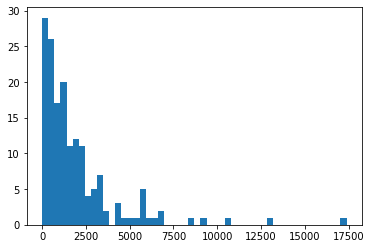

(array([29., 26., 17., 20., 11., 12., 11., 4., 5., 7., 2., 0., 3.,
 1., 1., 1., 5., 1., 1., 2., 0., 0., 0., 0., 1., 0.,
 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0.,
 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]),
 array([6.000000e+00, 3.535400e+02, 7.010800e+02, 1.048620e+03,
 1.396160e+03, 1.743700e+03, 2.091240e+03, 2.438780e+03,
 2.786320e+03, 3.133860e+03, 3.481400e+03, 3.828940e+03,
 4.176480e+03, 4.524020e+03, 4.871560e+03, 5.219100e+03,
 5.566640e+03, 5.914180e+03, 6.261720e+03, 6.609260e+03,
 6.956800e+03, 7.304340e+03, 7.651880e+03, 7.999420e+03,
 8.346960e+03, 8.694500e+03, 9.042040e+03, 9.389580e+03,
 9.737120e+03, 1.008466e+04, 1.043220e+04, 1.077974e+04,
 1.112728e+04, 1.147482e+04, 1.182236e+04, 1.216990e+04,
 1.251744e+04, 1.286498e+04, 1.321252e+04, 1.356006e+04,
 1.390760e+04, 1.425514e+04, 1.460268e+04, 1.495022e+04,
 1.529776e+04, 1.564530e+04, 1.599284e+04, 1.634038e+04,
 1.668792e+04, 1.703546e+04, 1.738300e+04]),
 <a list of 50 Patch objects>)

In [0]:
print("std", np.std(counts))
print("mean", np.mean(counts))
plt.hist(counts, bins = 50)

#### For now we are not doing it, might try later

In [0]:
#After analyzing the distribution of categories, decided to bin anything greater than average count
# COUNT_THRESHOLD = 1967

# data_6_order = data_6_order.join(dest_mark_id_count, "DEST_CITY_MARKET_ID", "inner")

# def convertMinority(originalCol, colCount):
#   if colCount <= COUNT_THRESHOLD:
#     return originalCol
#   else:
#     return "MIN_CAT"
  
# udf_convertMin = udf(convertMinority, t.StringType())

# data_6_order = data_6_order.withColumn(udf_convertMin(data_6_order["DEST_CITY_MARKET_ID"], data_6_order["count"]))
# data_6_order = data_6_order.drop("DEST_CITY_MARKET_ID")
# data_6_order = data_6_order.drop("count")


#### Train/ Val Split

In [0]:
# data_6_order = data_6.withColumn("time_rank", f.percent_rank().over(Window.partitionBy().orderBy("ORIGIN_UTC")))
train = data_6_order.where("time_rank <= .8").drop("time_rank")
val = data_6_order.where("time_rank > .8").drop("time_rank")

print("Train size: ", train.count())
print("Val size: ", val.count())

#### Model #1 - Random Forest
* Categorical
* Numerical

In [0]:
m1_num_cols = ['DISTANCE','ORIGIN_FLIGHT_COUNT', 'DEST_FLIGHT_COUNT', 'PAGERANK',
               'AVG_WND_SPEED_ORIGIN', 'MIN_CIG_HEIGHT_ORIGIN',
               'MIN_VIS_DIS_ORIGIN', 'AVG_TMP_DEG_ORIGIN', 'AVG_DEW_DEG_ORIGIN',
               'AVG_SLP_ORIGIN', 'AVG_WND_SPEED_DEST', 'MIN_CIG_HEIGHT_DEST',
               'MIN_VIS_DIS_DEST', 'AVG_TMP_DEG_DEST', 'AVG_DEW_DEG_DEST',
               'AVG_SLP_DEST']


m1_cat_cols = ['MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK',
              'OP_UNIQUE_CARRIER', 'ORIGIN_CITY_MARKET_ID', 'ORIGIN',
              'ORIGIN_STATE_ABR', 'DEST_CITY_MARKET_ID', 'DEST',
              'DEST_STATE_ABR', 'ORIGIN_TZ', 'DEST_TZ', 'DEP_MIN', 
              'DEP_HOUR']

label_col = ["DEP_DEL15"]

m1_cols = m1_num_cols + m1_cat_cols + label_col

m1_train = train.select(*m1_cols).withColumnRenamed('DEP_DEL15', 'label')
m1_val = val.select(*m1_cols).withColumnRenamed('DEP_DEL15', 'label')

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-2158640876510660> in <module> 
 17 m1_cols = m1_num_cols + m1_cat_cols + label_col
 18 
 ---> 19 m1_train = train . select ( * m1_cols ) . withColumnRenamed ( 'DEP_DEL15' , 'label' ) 
 20 m1_val = val . select ( * m1_cols ) . withColumnRenamed ( 'DEP_DEL15' , 'label' ) 

 NameError : name 'train' is not defined

In [0]:
display(m1_train)

DISTANCE,ORIGIN_FLIGHT_COUNT,DEST_FLIGHT_COUNT,PAGERANK,AVG_WND_SPEED_ORIGIN,MIN_CIG_HEIGHT_ORIGIN,MIN_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,AVG_DEW_DEG_ORIGIN,AVG_SLP_ORIGIN,AVG_WND_SPEED_DEST,MIN_CIG_HEIGHT_DEST,MIN_VIS_DIS_DEST,AVG_TMP_DEG_DEST,AVG_DEW_DEG_DEST,AVG_SLP_DEST,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_STATE_ABR,DEST_CITY_MARKET_ID,DEST,DEST_STATE_ABR,ORIGIN_TZ,DEST_TZ,DEP_MIN,DEP_HOUR,label
534.0,1086,195,0.05425050648176137,30.5,1311,402,-16.75,-65.125,10274.5,29.09090909090909,22000,16093,-27.0,-119.81818181818181,10240.454545454546,1,1,4,EV,30397,ATL,GA,30852,IAD,VA,America/New_York,America/New_York,40,5,1.0
701.0,1086,13,0.05425050648176137,30.5,1311,402,-16.75,-65.125,10274.5,35.6875,22000,16093,-46.125,-116.0625,10214.125,1,1,4,F9,30397,ATL,GA,35356,TTN,NJ,America/New_York,America/New_York,0,6,1.0
1440.0,936,506,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,24.6,610,1609,-18.0,-46.4,10144.8,1,1,4,US,30977,ORD,IL,30466,PHX,AZ,America/Chicago,America/Phoenix,0,5,0.0
925.0,936,585,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,32.84615384615385,1280,12875,28.615384615384617,-23.076923076923077,10272.076923076924,1,1,4,UA,30977,ORD,IL,31453,IAH,TX,America/Chicago,America/Chicago,10,5,0.0
1182.0,936,333,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,24.833333333333332,427,805,210.25,200.08333333333334,10210.166666666666,1,1,4,NK,30977,ORD,IL,32467,FLL,FL,America/Chicago,America/New_York,30,5,0.0
888.0,936,706,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,33.25,22000,16093,-144.625,-203.5,10234.875,1,1,4,UA,30977,ORD,IL,30325,DEN,CO,America/Chicago,America/Denver,33,5,0.0
235.0,936,340,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,62.705882352941174,914,16093,-71.82352941176471,-139.41176470588235,10199.35294117647,1,1,4,EV,30977,ORD,IL,31295,DTW,MI,America/Chicago,America/Detroit,35,5,1.0
867.0,936,345,0.04521768069470927,49.2962962962963,152,3219,-62.592592592592595,-109.77777777777777,10208.777777777777,39.733333333333334,1372,16093,-59.4,-140.46666666666667,10170.866666666667,1,1,4,B6,30977,ORD,IL,30721,BOS,MA,America/Chicago,America/New_York,40,5,0.0
762.0,1086,357,0.05425050648176137,30.5,1311,402,-16.75,-65.125,10274.5,49.111111111111114,22000,16093,-43.22222222222222,-140.0,10194.777777777777,1,1,4,DL,30397,ATL,GA,31703,LGA,NY,America/New_York,America/New_York,45,6,0.0
689.0,1086,585,0.05425050648176137,30.5,1311,402,-16.75,-65.125,10274.5,32.84615384615385,1280,12875,28.615384615384617,-23.076923076923077,10272.076923076924,1,1,4,OO,30397,ATL,GA,31453,IAH,TX,America/New_York,America/Chicago,46,6,0.0


#### Feature Engineering Pipeline
This way we can easily extend it to other data sets 

1. One Hot Encoding

In [0]:
col_vec_out = [x+'_catVec' for x in m1_cat_cols]

#StringIndex into labelled indices
indexers = [StringIndexer(inputCol=x, outputCol= x+'_tmp') for x in m1_cat_cols]

#OneHotEncoder, indices into sparse one hot encoded columns
encoders = [OneHotEncoder(dropLast=False, inputCol=x+'_tmp', outputCol=y) for x,y in zip(m1_cat_cols, col_vec_out)]

#Create pair of zips 
stages = [[i,j] for i,j in zip(indexers, encoders)]

#Flatten into stages
stages = [stage for sublist in stages for stage in sublist]

In [0]:
stages

Out[79]: [StringIndexer_8e298e293795,
 OneHotEncoder_0cda65b0d8df,
 StringIndexer_8e87c9acb4c7,
 OneHotEncoder_99481915db45,
 StringIndexer_8246d4d12eb2,
 OneHotEncoder_74065a2f9282,
 StringIndexer_4dbe361fbf54,
 OneHotEncoder_540024d9b2f0,
 StringIndexer_5fd2cc7a9664,
 OneHotEncoder_d45d7ec98976,
 StringIndexer_25a823a9efc7,
 OneHotEncoder_59206871d52f,
 StringIndexer_7d38b9378858,
 OneHotEncoder_b3545d0ece98,
 StringIndexer_c89bcbda1908,
 OneHotEncoder_a6d12e9de1d5,
 StringIndexer_885669f55049,
 OneHotEncoder_085c47261277,
 StringIndexer_ad3d0eda4410,
 OneHotEncoder_412a3ee7771d,
 StringIndexer_d9820ef8e378,
 OneHotEncoder_b6d183b76e03,
 StringIndexer_2f0357387b41,
 OneHotEncoder_ae52c47d0a42,
 StringIndexer_9e2afab18f54,
 OneHotEncoder_d83b9e3dc058,
 StringIndexer_e90b249f4ae9,
 OneHotEncoder_f16a9e19d124]

In [0]:
m1_cols = m1_num_cols + col_vec_out
vector_assembler = VectorAssembler(inputCols=m1_cols, outputCol="features")
stages += [vector_assembler]
pipeline = Pipeline().setStages(stages)

In [0]:
%%time

#MISLEADING - But no actualy model fitting is happening here. Just creating the 1 hot encoded columns
m1_train = pipeline.fit(m1_train).transform(m1_train)
m1_val = pipeline.fit(m1_val).transform(m1_val)

CPU times: user 212 ms, sys: 60 ms, total: 272 ms
Wall time: 1min 43s

In [0]:
display(m1_train)

MIN_CIG_HEIGHT_ORIGIN,label,DAY_OF_WEEK,ORIGIN,DEST,AVG_WND_SPEED_DEST,AVG_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,DISTANCE,DEST_STATE_ABR,ORIGIN_TZ,AVG_DEW_DEG_DEST,DEP_HOUR,ORIGIN_STATE_ABR,OP_UNIQUE_CARRIER,AVG_TMP_DEG_DEST,MONTH,AVG_SLP_ORIGIN,MIN_CIG_HEIGHT_DEST,ARR_HOUR,ORIGIN_FLIGHT_COUNT,CRS_ELAPSED_TIME_AVG_DIFF,AVG_CIG_HEIGHT_ORIGIN,AVG_WND_SPEED_ORIGIN,DEST_FLIGHT_COUNT,WEST_TO_EAST,AVG_DEW_DEG_ORIGIN,DEST_TZ,MIN_VIS_DIS_ORIGIN,AVG_VIS_DIS_DEST,DELAYS_SO_FAR,MIN_VIS_DIS_DEST,AVG_SLP_DEST,AVG_CIG_HEIGHT_DEST,CRS_ELAPSED_TIME,PAGERANK,CLASS_WEIGHTS
22000.0,1.0,4,ABE,ORD,41.7962962962963,16081.076923076924,190.84615384615384,654.0,IL,America/New_York,103.38513513513513,17,PA,EV,228.5703125,5,10283.76,2286.0,18,18,-8.253675213675223,22000.0,24.970625000000002,1847,0,2.625,America/Chicago,16000.0,16089.836734693878,1.0,16000.0,10235.306918822756,19508.624913355172,129.0,9.123668620151711E-4,0.8213681992794323
823.0,0.0,2,ABE,ORD,24.391304347826086,15998.35294117647,-104.25,655.0,IL,America/New_York,-160.4240506329114,6,PA,EV,-94.39097744360902,1,10197.02380952381,518.0,7,11,2.7463247863247773,18698.71875,57.62162162162162,1237,0,-168.83333333333334,America/Chicago,14484.0,15854.662420382165,0.0,2816.0,10307.8188743289,18773.735099337748,140.0,9.123668620151711E-4,0.17863180072056772
91.0,0.0,2,ABE,ORD,20.32941176470588,6307.576271186441,148.38888888888889,655.0,IL,America/New_York,29.70138888888889,17,PA,EV,158.64285714285714,11,10115.783676046176,244.0,18,18,-1.2536752136752227,364.07142857142856,48.32786885245902,1828,0,135.83333333333334,America/Chicago,1609.0,15654.104895104894,0.0,4828.0,10180.026362179487,19231.97142857143,136.0,9.123668620151711E-4,0.17863180072056772
61.0,0.0,1,ABE,ORD,75.6,14833.58695652174,185.16666666666666,654.0,IL,America/New_York,61.2108843537415,17,PA,EV,152.09426229508196,4,10036.113605692553,91.0,18,18,-7.253675213675223,4607.617021276596,31.08695652173913,1777,0,146.5625,America/Chicago,2816.0,15357.253424657534,0.0,2816.0,10007.312268125512,4537.661971830986,130.0,9.123668620151711E-4,0.17863180072056772
30.0,0.0,6,ABE,ORD,9.152380952380952,7738.404255319149,210.1639344262295,655.0,IL,America/New_York,171.7793103448276,6,PA,EV,197.9724409448819,7,10135.570887445889,30.0,7,12,-7.253675213675223,4300.6875,9.6,1515,0,203.81632653061226,America/Chicago,402.0,14694.448979591836,0.0,402.0,10192.774553718464,19248.867132867133,130.0,9.123668620151711E-4,0.17863180072056772
1829.0,0.0,7,ABE,ORD,39.57142857142857,16081.375,179.52941176470588,655.0,IL,America/New_York,81.06849315068493,17,PA,EV,226.79527559055117,5,10082.72,1250.0,18,12,-1.2536752136752227,18058.783064713065,78.56410256410257,1287,0,0.08108108108108109,America/Chicago,16000.0,15987.739436619719,1.0,9656.0,10149.567670970828,18848.1717145495,136.0,9.123668620151711E-4,0.17863180072056772
61.0,0.0,2,ABE,ORD,4.661538461538462,11760.839285714286,209.0144927536232,655.0,IL,America/New_York,193.80864197530863,6,PA,EV,217.59040590405905,8,10168.085400806089,30.0,7,18,-8.253675213675223,2309.285714285714,10.086206896551724,1474,0,202.09259259259258,America/Chicago,402.0,10914.625766871166,0.0,0.0,10180.278740506059,17803.55,129.0,9.123668620151711E-4,0.17863180072056772
91.0,1.0,1,ABE,ORD,19.87425149700599,13761.589743589744,190.92307692307693,654.0,IL,America/New_York,184.82467532467533,6,PA,EV,206.87832699619773,8,10106.55,61.0,7,18,-14.253675213675223,20876.46153846154,7.825,1767,0,168.575,America/Chicago,402.0,15482.941176470587,0.0,402.0,10086.898698358802,19123.91390728477,123.0,9.123668620151711E-4,0.8213681992794323
488.0,0.0,1,ABE,ORD,43.58659217877095,14947.923076923076,-24.115384615384617,655.0,IL,America/New_York,-57.92156862745098,6,PA,EV,0.5938697318007663,1,10144.292307692307,579.0,7,8,1.7463247863247773,11228.351351351352,38.146341463414636,1397,0,-76.2,America/Chicago,2816.0,15648.348684210527,1.0,2414.0,10259.91974822974,7229.651315789473,139.0,9.123668620151711E-4,0.17863180072056772
22000.0,0.0,2,ABE,ORD,39.24293785310734,

In [0]:
%%time

rf = RandomForestClassifier(labelCol='label',featuresCol='features', numTrees=50)
rf_model = rf.fit(m1_train)

m1_train_results = rf_model.transform(m1_train)
m1_val_results = rf_model.transform(m1_val)

CPU times: user 140 ms, sys: 20 ms, total: 160 ms
Wall time: 1min 39s

#### Model #1 - EVAL

In [0]:
#Set up BinClassEval
evaluator = BinaryClassificationEvaluator()
evaluator.setRawPredictionCol("raw")

trainScoreAndLabels = m1_train_results.select(['probability','label', col("prediction").alias("raw")])
valScoreAndLabels = m1_val_results.select(['probability','label', col("prediction").alias("raw")])

#prepare score-label set
# m1_train_scores = [(float(i[0][0]), 1.0-float(i[1])) for i in trainScoreAndLabels.collect()]
# m1_val_scores = [(float(i[0][0]), 1.0-float(i[1])) for i in valScoreAndLabels.collect()]

print("Train Set")
print("areaUnderPR: ", evaluator.evaluate(trainScoreAndLabels, {evaluator.metricName: "areaUnderPR"}))
print("areaUnderROC: ",evaluator.evaluate(trainScoreAndLabels, {evaluator.metricName: "areaUnderROC"}))

# #prepare score-label set
# m1_val_collect = m1_val_results.collect()
# m1_val_results = [(float(i[0][0]), 1.0-float(i[1])) for i in m1_val_collect]
# scoreAndLabels = sc.parallelize(m1_val_results)
# metrics = BinaryClassificationEvaluator(scoreAndLabels)

# print("Val Set")
# print("areaUnderPR: ", evaluator.evaluate(scoreAndLabels, {metrics.metricName: "areaUnderPR"}))
# print("areaUnderROC: ",evaluator.evaluate(scoreAndLabels, {metrics.metricName: "areaUnderROC"}))


Train Set
areaUnderPR: 0.21079606866281075
areaUnderROC: 0.5

In [0]:
display(trainScoreAndLabels)

probability,label,raw
"Map(vectorType -> dense, length -> 2, values -> List(0.7911838810494044, 0.2088161189505956))",1.0,0.0
"Map(vectorType -> dense, length -> 2, values -> List(0.796994033785675, 0.20300596621432498))",1.0,0.0
"Map(vectorType -> dense, length -> 2, values -> List(0.7237620575374298, 0.2762379424625702))",0.0,0.0
"Map(vectorType -> dense, length -> 2, values -> List(0.7126418340133408, 0.28735816598665925))",0.0,0.0
"Map(vectorType -> dense, length -> 2, values -> List(0.7014846770357875, 0.29851532296421246))",0.0,0.0
"Map(vectorType -> dense, length -> 2, values -> List(0.6982235716917655, 0.3017764283082344))",0.0,0.0
"Map(vectorType -> dense, length -> 2, values -> List(0.7013626344822054, 0.29863736551779474))",1.0,0.0
"Map(vectorType -> dense, length -> 2, values -> List(0.701118866553927, 0.29888113344607303))",0.0,0.0
"Map(vectorType -> dense, length -> 2, values -> List(0.802147820695507, 0.19785217930449298))",0.0,0.0
"Map(vectorType -> dense, length -> 2, values -> List(0.8104810153659074, 0.18951898463409253))",0.0,0.0


In [0]:
trainScoreAndLabels_col = trainScoreAndLabels.collect()
trainScoreAndLabels_col

Out[109]: [Row(probability=DenseVector([0.7912, 0.2088]), label=1.0, raw=0.0),
 Row(probability=DenseVector([0.797, 0.203]), label=1.0, raw=0.0),
 Row(probability=DenseVector([0.7238, 0.2762]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7126, 0.2874]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7015, 0.2985]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.6982, 0.3018]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7014, 0.2986]), label=1.0, raw=0.0),
 Row(probability=DenseVector([0.7011, 0.2989]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8021, 0.1979]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8105, 0.1895]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8144, 0.1856]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.6812, 0.3188]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7251, 0.2749]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.806, 0.194]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8085, 0.1915]), label=1.0, raw=0.0),
 Row(probability=DenseVector([0.809, 0.191]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7136, 0.2864]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7023, 0.2977]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8004, 0.1996]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7942, 0.2058]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7991, 0.2009]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7948, 0.2052]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8117, 0.1883]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7138, 0.2862]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7889, 0.2111]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.6884, 0.3116]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.802, 0.198]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8007, 0.1993]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.709, 0.291]), label=1.0, raw=0.0),
 Row(probability=DenseVector([0.8157, 0.1843]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7163, 0.2837]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7255, 0.2745]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.6996, 0.3004]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7124, 0.2876]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.81, 0.19]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8034, 0.1966]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8034, 0.1966]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7976, 0.2024]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8169, 0.1831]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8015, 0.1985]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8144, 0.1856]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8156, 0.1844]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8129, 0.1871]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8012, 0.1988]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.6989, 0.3011]), label=1.0, raw=0.0),
 Row(probability=DenseVector([0.8087, 0.1913]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7123, 0.2877]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7137, 0.2863]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.805, 0.195]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7991, 0.2009]), label=1.0, raw=0.0),
 Row(probability=DenseVector([0.8157, 0.1843]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8119, 0.1881]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7927, 0.2073]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.816, 0.184]), label=1.0, raw=0.0),
 Row(probability=DenseVector([0.7319, 0.2681]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.815, 0.185]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.7084, 0.2916]), label=0.0, raw=0.0),
 Row(probability=DenseVector([0.8156, 0.1844]), label=0.0, raw=0.0),
 Row(pro

In [0]:
m1_train_scores = [(float(i[0][1]), 1.0-float(i[1])) for i in trainScoreAndLabels.collect()]

In [0]:
m1_train_scores

Out[105]: [(0.7911838810494044, 0.0),
 (0.796994033785675, 0.0),
 (0.7237620575374298, 1.0),
 (0.7126418340133408, 1.0),
 (0.7014846770357875, 1.0),
 (0.6982235716917655, 1.0),
 (0.7013626344822054, 0.0),
 (0.701118866553927, 1.0),
 (0.802147820695507, 1.0),
 (0.8104810153659074, 1.0),
 (0.8144184424047941, 1.0),
 (0.6812174502135221, 1.0),
 (0.725090269078949, 1.0),
 (0.8059696543772069, 1.0),
 (0.8085232908849352, 0.0),
 (0.808966586909018, 1.0),
 (0.7136302268976895, 1.0),
 (0.7022591663583135, 1.0),
 (0.8003986214494276, 1.0),
 (0.7991321927825441, 1.0),
 (0.7941722393892641, 1.0),
 (0.7947661749681982, 1.0),
 (0.8116948917065842, 1.0),
 (0.7138442365964731, 1.0),
 (0.7889073308236246, 1.0),
 (0.6883605423669593, 1.0),
 (0.8019629746892986, 1.0),
 (0.8006783908523624, 1.0),
 (0.7089974129452734, 0.0),
 (0.7163288422124574, 1.0),
 (0.7254930108226558, 1.0),
 (0.8156684043758508, 1.0),
 (0.6995758536410538, 1.0),
 (0.8099757314976785, 1.0),
 (0.7124201995567836, 1.0),
 (0.8034369281988913, 1.0),
 (0.8034369281988913, 1.0),
 (0.7976069685689262, 1.0),
 (0.801509413543567, 1.0),
 (0.8169007333989711, 1.0),
 (0.8144019757089672, 1.0),
 (0.8129400995782846, 1.0),
 (0.8011604558683942, 1.0),
 (0.8155672302157555, 1.0),
 (0.6988877491258844, 0.0),
 (0.8049532935660615, 1.0),
 (0.8087434024745583, 1.0),
 (0.7123037582163572, 1.0),
 (0.7137139170237355, 1.0),
 (0.7990661703741717, 0.0),
 (0.8156684043758508, 1.0),
 (0.8119380405276915, 1.0),
 (0.8150108038999211, 1.0),
 (0.81598326240726, 0.0),
 (0.792748353174352, 1.0),
 (0.7318769786899787, 1.0),
 (0.708401928257732, 1.0),
 (0.8156343047320875, 1.0),
 (0.7075835168105804, 0.0),
 (0.8017408861101513, 1.0),
 (0.7883683046658835, 1.0),
 (0.805157114791866, 1.0),
 (0.8053856119912326, 1.0),
 (0.713994115962629, 1.0),
 (0.6935983317349839, 1.0),
 (0.805157114791866, 1.0),
 (0.8156343047320875, 0.0),
 (0.7039296769770551, 1.0),
 (0.7045135463006991, 1.0),
 (0.7982356956470334, 1.0),
 (0.8030287296538802, 1.0),
 (0.8029732151332716, 0.0),
 (0.808642228314463, 1.0),
 (0.8111754960695938, 1.0),
 (0.7181462117661056, 1.0),
 (0.8143053461194844, 1.0),
 (0.8012942489373002, 1.0),
 (0.8143053461194844, 1.0),
 (0.7936652023324853, 1.0),
 (0.8044227836136072, 1.0),
 (0.7936652023324853, 0.0),
 (0.7032821016767076, 1.0),
 (0.6991236785880478, 1.0),
 (0.7080581255526117, 1.0),
 (0.7062109087345498, 1.0),
 (0.7989718121039926, 1.0),
 (0.7110247808583936, 1.0),
 (0.7989718121039926, 1.0),
 (0.7937693116678329, 1.0),
 (0.7029173131110812, 1.0),
 (0.7919897717983266, 1.0),
 (0.8011001972419787, 1.0),
 (0.7156231594209055, 1.0),
 (0.8024858541523227, 0.0),
 (0.8018638499241616, 1.0),
 (0.7052784495364919, 1.0),
 (0.7129654195694469, 1.0),
 (0.7112913520723434, 1.0),
 (0.8090527681144591, 1.0),
 (0.7980543411122818, 1.0),
 (0.7998385681149182, 1.0),
 (0.7155606249592223, 1.0),
 (0.7042332100303061, 1.0),
 (0.7005731963370622, 1.0),
 (0.7123011628741538, 0.0),
 (0.8102850971375793, 1.0),
 (0.7111739852215124, 0.0),
 (0.6898136789487498, 1.0),
 (0.8048191529026294, 1.0),
 (0.7974524959936795, 1.0),
 (0.8090527681144591, 1.0),
 (0.7112913520723434, 0.0),
 (0.8011001972419787, 1.0),
 (0.8090527681144591, 1.0),
 (0.7187636686150137, 1.0),
 (0.7860583524846304, 0.0),
 (0.7009396144068376, 0.0),
 (0.7876185353512148, 1.0),
 (0.7123011628741538, 0.0),
 (0.7095464593748679, 0.0),
 (0.7001748558984703, 1.0),
 (0.7939563441901042, 1.0),
 (0.783933402430647, 1.0),
 (0.7977394830808724, 1.0),
 (0.7029821373705283, 0.0),
 (0.7926325800273277, 1.0),
 (0.8001827262502677, 1.0),
 (0.7886914356244646, 1.0),
 (0.8090527681144591, 1.0),
 (0.6992763068685429, 1.0),
 (0.8004490276662255, 1.0),
 (0.7062109087345498, 1.0),
 (0.8102850971375793, 1.0),
 (0.7987320353489427, 1.0),
 (0.8033600952362868, 0.0),
 (0.7989162975833842, 1.0),
 (0.7919897717983266, 1.0),
 (0.7080581255526117, 1.0),
 (0.7999638750996858, 1.0),
 (0.7926184988764341, 1.0),
 (0.8093676261458683, 1.0),
 (0.7895273668414613, 1.0),
 (0.801728924320086, 1.0),
 (

In [0]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test, y_score)

Out[112]: 0.3466349662560929

#### Visualize AUC Curve

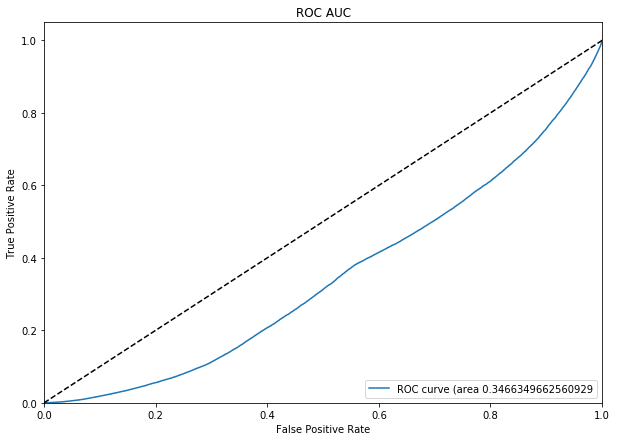

In [0]:
from sklearn.metrics import roc_curve, auc

fpr = dict()
tpr = dict()
roc_auc = dict()

y_test = [i[1] for i in m1_train_scores]
y_score = [i[0] for i in m1_train_scores]

fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr,tpr)

%matplotlib inline
plt.figure(figsize=(10,7))
plt.plot(fpr, tpr, label= 'ROC curve (area {0}'.format(roc_auc))
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC AUC")
plt.legend(loc="lower right")
plt.show()


### Goal 
Try out some tree based algorithms, **RandomForest** on our **ALL** data and see how we can extend this setup to our final dataset.

In [0]:
train_data = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/strategy/model_datasets/train/part-00*.parquet")
val_data = spark.read.option("header", "true").parquet(f"dbfs:/mnt/mids-w261/team20SSDK/strategy/model_datasets/validation/part-00*.parquet")

print(train_data.count())
display(train_data)


16828952

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,DIV_AIRPORT_LANDINGS,ORIGIN_TZ,DEST_TZ,DEP_MIN,DEP_HOUR,ARR_MIN,ARR_HOUR,ORIGIN_TS,ORIGIN_UTC,DEST_TS,DEST_UTC,ORIGIN_FLIGHT_COUNT,DEST_FLIGHT_COUNT,ORIGIN_STATION,ORIGIN_STATION_NAME,DEST_STATION,DEST_STATION_NAME,PAGERANK,ORIGIN_UTC_ADJ_MIN,ORIGIN_UTC_ADJ_MAX,ORIGIN_MAX_DATE,DEST_MAX_DATE,DELAYS_SO_FAR,CRS_ELAPSED_TIME_AVG_DIFF,WEST_TO_EAST,AVG_WND_SPEED_ORIGIN,AVG_CIG_HEIGHT_ORIGIN,MIN_CIG_HEIGHT_ORIGIN,AVG_VIS_DIS_ORIGIN,MIN_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,AVG_DEW_DEG_ORIGIN,AVG_SLP_ORIGIN,AVG_WND_SPEED_DEST,AVG_CIG_HEIGHT_DEST,MIN_CIG_HEIGHT_DEST,AVG_VIS_DIS_DEST,MIN_VIS_DIS_DEST,AVG_TMP_DEG_DEST,AVG_DEW_DEG_DEST,AVG_SLP_DEST
2015,2,5,14,4,2015-05-14,EV,20366,EV,N11547,6144,10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,1727,1746,19.0,19.0,1.0,1,1700-1759,10.0,1756,1850,7.0,1836,1857,21.0,21.0,1.0,1,1800-1859,0.0,0.0,129.0,131.0,114.0,1.0,654.0,3,0,America/New_York,America/Chicago,27,17,36,18,2015-05-14T17:27:00.000+0000,2015-05-14T21:27:00.000+0000,2015-05-14T18:36:00.000+0000,2015-05-14T23:36:00.000+0000,18,1847,72517014737,LEHIGH VALLEY INTERNATIONAL A,72530094846,CHICAGO O'HARE INTERNATIONAL,9.123668620151711E-4,2015-05-12T19:27:00.000+0000,2015-05-14T19:27:00.000+0000,2015-05-14T18:51:00.000+0000,2015-05-14T18:51:00.000+0000,1.0,-8.253675213675223,0,24.970625000000002,22000.0,22000.0,16081.076923076924,16000.0,190.84615384615384,2.625,10283.76,41.7962962962963,19508.624913355172,2286.0,16089.836734693878,16000.0,228.5703125,103.38513513513513,10235.306918822756
2016,1,1,19,2,2016-01-19,EV,20366,EV,N11565,6021,10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,13930,1393004,30977,ORD,"Chicago, IL",IL,17,Illinois,41,624,620,-4.0,0.0,0.0,-1,0600-0659,18.0,638,729,5.0,744,734,-10.0,0.0,0.0,-1,0700-0759,0.0,0.0,140.0,134.0,111.0,1.0,655.0,3,0,America/New_York,America/Chicago,24,6,44,7,2016-01-19T06:24:00.000+0000,2016-01-19T11:24:00.000+0000,2016-01-19T07:44:00.000+0000,2016-01-19T13:44:00.000+0000,11,1237,72517014737,LEHIGH VALLEY INTERNATIONAL A,72530094846,CHICAGO O'HARE INTERNATIONAL,9.123668620151711E-4,2016-01-17T09:24:00.000+0000,2016-01-19T09:24:00.000+0000,2016-01-19T08:51:00.000+0000,2016-01-19T08:51:00.000+0000,0.0,2.7463247863247773,0,57.62162162162162,18698.71875,823.0,15998.35294117647,14484.0,-104.25,-168.83333333333334,10197.02380952381,24.391304347826086,18773.735099337748,518.0,15854.662420382165,2816.0,-94.39097744360902,-160.4240506329114,10307.8188743289
2015,4,11,10,2,2015-11-10,EV,20366,EV,N12567,6144,10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,13930,1393004,30977,ORD,"Chicago, IL",IL,17,Illinois,41,1713,1716,3.0,3.0,0.0,0,1700-1759,8.0,1724,1806,9.0,1829,1815,-14.0,0.0,0.0,-1,1800-1859,0.0,0.0,136.0,119.0,102.0,1.0,655.0,3,0,America/New_York,America/Chicago,13,17,29,18,2015-11-10T17:13:00.000+0000,2015-11-10T22:13:00.000+0000,2015-11-10T18:29:00.000+0000,2015-11-11T00:29:00.000+0000,18,1828,72517014737,LEHIGH VALLEY INTERNATIONAL A,72530094846,CHICAGO O'HARE INTERNATIONAL,9.123668620151711E-4,2015-11-08T20:13:00.000+0000,2015-11-10T20:13:00.000+0000,2015-11-10T19:51:00.000+0000,2015-11-10T19:51:00.000+0000,0.0,-1.2536752136752227,0,48.32786885245902

In [0]:
print("Number of columns: ", len(train_data.columns))
np.array(train_data.columns)

Number of columns: 96
Out[6]: array(['YEAR', 'QUARTER', 'MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK',
 'FL_DATE', 'OP_UNIQUE_CARRIER', 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER', 'TAIL_NUM', 'OP_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID', 'ORIGIN_CITY_MARKET_ID', 'ORIGIN',
 'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR', 'ORIGIN_STATE_FIPS',
 'ORIGIN_STATE_NM', 'ORIGIN_WAC', 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID', 'DEST_CITY_MARKET_ID', 'DEST',
 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'DEST_STATE_FIPS',
 'DEST_STATE_NM', 'DEST_WAC', 'CRS_DEP_TIME', 'DEP_TIME',
 'DEP_DELAY', 'DEP_DELAY_NEW', 'DEP_DEL15', 'DEP_DELAY_GROUP',
 'DEP_TIME_BLK', 'TAXI_OUT', 'WHEELS_OFF', 'WHEELS_ON', 'TAXI_IN',
 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY', 'ARR_DELAY_NEW',
 'ARR_DEL15', 'ARR_DELAY_GROUP', 'ARR_TIME_BLK', 'CANCELLED',
 'DIVERTED', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME',
 'FLIGHTS', 'DISTANCE', 'DISTANCE_GROUP', 'DIV_AIRPORT_LANDINGS',
 'ORIGIN_TZ', 'DEST_TZ', 'DEP_MIN', 'DEP_HOUR', 'ARR_MIN',
 'ARR_HOUR', 'ORIGIN_TS', 'ORIGIN_UTC', 'DEST_TS', 'DEST_UTC',
 'ORIGIN_FLIGHT_COUNT', 'DEST_FLIGHT_COUNT', 'ORIGIN_STATION',
 'ORIGIN_STATION_NAME', 'DEST_STATION', 'DEST_STATION_NAME',
 'PAGERANK', 'ORIGIN_UTC_ADJ_MIN', 'ORIGIN_UTC_ADJ_MAX',
 'ORIGIN_MAX_DATE', 'DEST_MAX_DATE', 'DELAYS_SO_FAR',
 'CRS_ELAPSED_TIME_AVG_DIFF', 'WEST_TO_EAST',
 'AVG_WND_SPEED_ORIGIN', 'AVG_CIG_HEIGHT_ORIGIN',
 'MIN_CIG_HEIGHT_ORIGIN', 'AVG_VIS_DIS_ORIGIN',
 'MIN_VIS_DIS_ORIGIN', 'AVG_TMP_DEG_ORIGIN', 'AVG_DEW_DEG_ORIGIN',
 'AVG_SLP_ORIGIN', 'AVG_WND_SPEED_DEST', 'AVG_CIG_HEIGHT_DEST',
 'MIN_CIG_HEIGHT_DEST', 'AVG_VIS_DIS_DEST', 'MIN_VIS_DIS_DEST',
 'AVG_TMP_DEG_DEST', 'AVG_DEW_DEG_DEST', 'AVG_SLP_DEST'],
 dtype='<U25')

In [0]:
columns_to_drop = ['YEAR', 'QUARTER', 'DAY_OF_MONTH', 
                   'FL_DATE', 'OP_CARRIER_AIRLINE_ID',
                   'OP_CARRIER', 'TAIL_NUM', 'OP_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID',
                   'ORIGIN_AIRPORT_SEQ_ID', 'ORIGIN_CITY_MARKET_ID',
                   'ORIGIN_CITY_NAME', 'ORIGIN_STATE_FIPS',
                   'ORIGIN_STATE_NM', 'ORIGIN_WAC', 'DEST_AIRPORT_ID',
                   'DEST_AIRPORT_SEQ_ID', 'DEST_CITY_MARKET_ID',
                   'DEST_CITY_NAME', 'DEST_STATE_FIPS',
                   'DEST_STATE_NM', 'DEST_WAC', 'CRS_DEP_TIME', 'DEP_TIME',
                   'DEP_DELAY', 'DEP_DELAY_NEW',
                   'DEP_TIME_BLK', 'TAXI_OUT', 'WHEELS_OFF', 'WHEELS_ON', 'TAXI_IN',
                   'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY', 'ARR_DELAY_NEW','ARR_TIME_BLK', 
                   'CANCELLED','DIVERTED', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME',
                   'FLIGHTS', 'DISTANCE_GROUP', 'DIV_AIRPORT_LANDINGS',
                   'DEP_MIN', 'ARR_MIN','ORIGIN_TS',  'DEST_TS','ORIGIN_STATION',
                   'ORIGIN_STATION_NAME', 'DEST_STATION', 'DEST_STATION_NAME',
                   'ORIGIN_UTC_ADJ_MIN', 'ORIGIN_UTC_ADJ_MAX',
                   'ORIGIN_MAX_DATE', 'DEST_MAX_DATE']

cat_cols = ['MONTH', 'DAY_OF_WEEK', 'WEST_TO_EAST', 'DEP_HOUR','ARR_HOUR', 'OP_UNIQUE_CARRIER', 'ORIGIN', 'ORIGIN_STATE_ABR','DEST', 
            'DEST_STATE_ABR', 'ORIGIN_UTC', 'DEST_UTC','ORIGIN_TZ', 'DEST_TZ']

num_cols = [ 'ORIGIN_FLIGHT_COUNT', 'DEST_FLIGHT_COUNT','PAGERANK', 'CRS_ELAPSED_TIME',
             'DELAYS_SO_FAR','CRS_ELAPSED_TIME_AVG_DIFF','AVG_WND_SPEED_ORIGIN', 
             'AVG_CIG_HEIGHT_ORIGIN','MIN_CIG_HEIGHT_ORIGIN', 'AVG_VIS_DIS_ORIGIN',
             'MIN_VIS_DIS_ORIGIN', 'AVG_TMP_DEG_ORIGIN', 'AVG_DEW_DEG_ORIGIN',
             'AVG_SLP_ORIGIN', 'AVG_WND_SPEED_DEST', 'AVG_CIG_HEIGHT_DEST',
             'MIN_CIG_HEIGHT_DEST', 'AVG_VIS_DIS_DEST', 'MIN_VIS_DIS_DEST',
             'AVG_TMP_DEG_DEST', 'AVG_DEW_DEG_DEST', 'AVG_SLP_DEST', 'DISTANCE']

label_cols = [ 'DEP_DEL15', 'DEP_DELAY_GROUP', 'ARR_DEL15', 'ARR_DELAY_GROUP']

print("Number of dropped columns: ", len(columns_to_drop))

#Drop on Train
train_final = train_data.drop(*columns_to_drop)

#Drop on Val
val_final = val_data.drop(*columns_to_drop)

print("Remaining Col Count: ", len(train_final.columns))
display(train_final)

Number of dropped columns: 55
Remaining Col Count: 41

MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,ORIGIN,ORIGIN_STATE_ABR,DEST,DEST_STATE_ABR,DEP_DEL15,DEP_DELAY_GROUP,ARR_DEL15,ARR_DELAY_GROUP,CRS_ELAPSED_TIME,DISTANCE,ORIGIN_TZ,DEST_TZ,DEP_HOUR,ARR_HOUR,ORIGIN_UTC,DEST_UTC,ORIGIN_FLIGHT_COUNT,DEST_FLIGHT_COUNT,PAGERANK,DELAYS_SO_FAR,CRS_ELAPSED_TIME_AVG_DIFF,WEST_TO_EAST,AVG_WND_SPEED_ORIGIN,AVG_CIG_HEIGHT_ORIGIN,MIN_CIG_HEIGHT_ORIGIN,AVG_VIS_DIS_ORIGIN,MIN_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,AVG_DEW_DEG_ORIGIN,AVG_SLP_ORIGIN,AVG_WND_SPEED_DEST,AVG_CIG_HEIGHT_DEST,MIN_CIG_HEIGHT_DEST,AVG_VIS_DIS_DEST,MIN_VIS_DIS_DEST,AVG_TMP_DEG_DEST,AVG_DEW_DEG_DEST,AVG_SLP_DEST
5,4,EV,ABE,PA,ORD,IL,1.0,1,1.0,1,129.0,654.0,America/New_York,America/Chicago,17,18,2015-05-14T21:27:00.000+0000,2015-05-14T23:36:00.000+0000,18,1847,9.123668620151711E-4,1.0,-8.253675213675223,0,24.970625000000002,22000.0,22000.0,16081.076923076924,16000.0,190.84615384615384,2.625,10283.76,41.7962962962963,19508.624913355172,2286.0,16089.836734693878,16000.0,228.5703125,103.38513513513513,10235.306918822756
1,2,EV,ABE,PA,ORD,IL,0.0,-1,0.0,-1,140.0,655.0,America/New_York,America/Chicago,6,7,2016-01-19T11:24:00.000+0000,2016-01-19T13:44:00.000+0000,11,1237,9.123668620151711E-4,0.0,2.7463247863247773,0,57.62162162162162,18698.71875,823.0,15998.35294117647,14484.0,-104.25,-168.83333333333334,10197.02380952381,24.391304347826086,18773.735099337748,518.0,15854.662420382165,2816.0,-94.39097744360902,-160.4240506329114,10307.8188743289
11,2,EV,ABE,PA,ORD,IL,0.0,0,0.0,-1,136.0,655.0,America/New_York,America/Chicago,17,18,2015-11-10T22:13:00.000+0000,2015-11-11T00:29:00.000+0000,18,1828,9.123668620151711E-4,0.0,-1.2536752136752227,0,48.32786885245902,364.07142857142856,91.0,6307.576271186441,1609.0,148.38888888888889,135.83333333333334,10115.783676046176,20.32941176470588,19231.97142857143,244.0,15654.104895104894,4828.0,158.64285714285714,29.70138888888889,10180.026362179487
4,1,EV,ABE,PA,ORD,IL,0.0,-1,1.0,1,130.0,654.0,America/New_York,America/Chicago,17,18,2015-04-20T21:38:00.000+0000,2015-04-20T23:48:00.000+0000,18,1777,9.123668620151711E-4,0.0,-7.253675213675223,0,31.08695652173913,4607.617021276596,61.0,14833.58695652174,2816.0,185.16666666666666,146.5625,10036.113605692553,75.6,4537.661971830986,91.0,15357.253424657534,2816.0,152.09426229508196,61.2108843537415,10007.312268125512
7,6,EV,ABE,PA,ORD,IL,0.0,-1,0.0,-1,130.0,655.0,America/New_York,America/Chicago,6,7,2017-07-15T10:35:00.000+0000,2017-07-15T12:45:00.000+0000,12,1515,9.123668620151711E-4,0.0,-7.253675213675223,0,9.6,4300.6875,30.0,7738.404255319149,402.0,210.1639344262295,203.81632653061226,10135.570887445889,9.152380952380952,19248.867132867133,30.0,14694.448979591836,402.0,197.9724409448819,171.7793103448276,10192.774553718464
5,7,EV,ABE,PA,ORD,IL,0.0,-1,0.0,-1,136.0,655.0,America/New_York,America/Chicago,17,18,2016-05-08T21:11:00.000+0000,2016-05-08T23:27:00.000+0000,12,1287,9.123668620151711E-4,1.0,-1.2536752136752227,0,78.56410256410257,18058.783064713065,1829.0,16081.375,16000.0,179.52941176470588,0.08108108108108109,10082.72,39.57142857142857,18848.1717145495,1250.0,15987.739436619719,9656.0,226.79527559055117,81.06849315068493,10149.567670970828
8,2,EV,ABE,PA,ORD,IL,0.0,-1,0.0,0,129.0,655.0,America/New_York,America/Chicago,6,7,2016-08-02T10:00:00.000+0000,2016-08-02T12:09:00.000+0000,18,1474,9.123668620151711E-4,0.0,-8.253675213675223,0,10.086206896551724,2309.285714285714,61.0,11760.839285714286,402.0,209.0144927536232,202.09259259259258,10168.085400806089,4.661538461538462,17803.55,30.0,10914.625766871166,0.0,217.59040590405905,193.80864197530863,10180.278740506059
8,1,EV,ABE,PA,ORD,IL,1.0,2,1.0,1,123.0,654.0,America/New_York,America/Chicago,6,7,2015-08-03T10:44:00.000+0000,2015-08-03T12:47:00.000+0000,18,1767,9.123668620151711E-4,0.0,-14.253675213675223,0,7.825,20876.46153846154,91.0,13761.589743589744,402.0,190.92307692307693,168.575,10106.55,19.87425149700599,19123.91390728477,61.0,15482.941176470587,402.0,206.87832699619773,184.82467532467533,10086.89869835

In [0]:
#Apply Balance Ratio, build this only from Train
balancing_ratio = train_final.filter("DEP_DEL15 == 0").count() / train_final.count()
print("Balancing Ratio =", balancing_ratio)

train_final = train_final.withColumn("CLASS_WEIGHTS", when(train_final.DEP_DEL15 == 1, balancing_ratio) \
                               .otherwise(1 - balancing_ratio))


val_final = val_final.withColumn("CLASS_WEIGHTS", when(val_final.DEP_DEL15 == 1, balancing_ratio) \
                               .otherwise(1 - balancing_ratio))

Balancing Ratio = 0.8213681992794323

#### To Extract Feature Importance

In [0]:
#Returns a Pandas DF with top features and scores
def ExtractFeatureImp(featureImp, dataset, featuresCol):
    list_extract = []
    for i in dataset.schema[featuresCol].metadata["ml_attr"]["attrs"]:
        list_extract = list_extract + dataset.schema[featuresCol].metadata["ml_attr"]["attrs"][i]
    varlist = pd.DataFrame(list_extract)
    varlist['score'] = varlist['idx'].apply(lambda x: featureImp[x])
    return(varlist.sort_values('score', ascending = False))

### M1 - "Kitchen Sink"
Throw everything we have at it!

In [0]:
label_col = ['DEP_DEL15']
m1_cat = list(set(cat_cols) - set(['ORIGIN_UTC', 'DEST_UTC']))
m1_cols = list(set(cat_cols + num_cols + label_col) - set(['ORIGIN_UTC', 'DEST_UTC'])) + ["CLASS_WEIGHTS"]

m1_train = train_final.select(*m1_cols).withColumnRenamed('DEP_DEL15', 'label')
m1_val = val_final.select(*m1_cols).withColumnRenamed('DEP_DEL15', 'label')

display(m1_train)

MIN_CIG_HEIGHT_ORIGIN,label,DAY_OF_WEEK,ORIGIN,DEST,AVG_WND_SPEED_DEST,AVG_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,DISTANCE,DEST_STATE_ABR,ORIGIN_TZ,AVG_DEW_DEG_DEST,DEP_HOUR,ORIGIN_STATE_ABR,OP_UNIQUE_CARRIER,AVG_TMP_DEG_DEST,MONTH,AVG_SLP_ORIGIN,MIN_CIG_HEIGHT_DEST,ARR_HOUR,ORIGIN_FLIGHT_COUNT,CRS_ELAPSED_TIME_AVG_DIFF,AVG_CIG_HEIGHT_ORIGIN,AVG_WND_SPEED_ORIGIN,DEST_FLIGHT_COUNT,WEST_TO_EAST,AVG_DEW_DEG_ORIGIN,DEST_TZ,MIN_VIS_DIS_ORIGIN,AVG_VIS_DIS_DEST,DELAYS_SO_FAR,MIN_VIS_DIS_DEST,AVG_SLP_DEST,AVG_CIG_HEIGHT_DEST,CRS_ELAPSED_TIME,PAGERANK,CLASS_WEIGHTS
22000.0,1.0,4,ABE,ORD,41.7962962962963,16081.076923076924,190.84615384615384,654.0,IL,America/New_York,103.38513513513513,17,PA,EV,228.5703125,5,10283.76,2286.0,18,18,-8.253675213675223,22000.0,24.970625000000002,1847,0,2.625,America/Chicago,16000.0,16089.836734693878,1.0,16000.0,10235.306918822756,19508.624913355172,129.0,9.123668620151711E-4,0.8213681992794323
823.0,0.0,2,ABE,ORD,24.391304347826086,15998.35294117647,-104.25,655.0,IL,America/New_York,-160.4240506329114,6,PA,EV,-94.39097744360902,1,10197.02380952381,518.0,7,11,2.7463247863247773,18698.71875,57.62162162162162,1237,0,-168.83333333333334,America/Chicago,14484.0,15854.662420382165,0.0,2816.0,10307.8188743289,18773.735099337748,140.0,9.123668620151711E-4,0.17863180072056772
91.0,0.0,2,ABE,ORD,20.32941176470588,6307.576271186441,148.38888888888889,655.0,IL,America/New_York,29.70138888888889,17,PA,EV,158.64285714285714,11,10115.783676046176,244.0,18,18,-1.2536752136752227,364.07142857142856,48.32786885245902,1828,0,135.83333333333334,America/Chicago,1609.0,15654.104895104894,0.0,4828.0,10180.026362179487,19231.97142857143,136.0,9.123668620151711E-4,0.17863180072056772
61.0,0.0,1,ABE,ORD,75.6,14833.58695652174,185.16666666666666,654.0,IL,America/New_York,61.2108843537415,17,PA,EV,152.09426229508196,4,10036.113605692553,91.0,18,18,-7.253675213675223,4607.617021276596,31.08695652173913,1777,0,146.5625,America/Chicago,2816.0,15357.253424657534,0.0,2816.0,10007.312268125512,4537.661971830986,130.0,9.123668620151711E-4,0.17863180072056772
30.0,0.0,6,ABE,ORD,9.152380952380952,7738.404255319149,210.1639344262295,655.0,IL,America/New_York,171.7793103448276,6,PA,EV,197.9724409448819,7,10135.570887445889,30.0,7,12,-7.253675213675223,4300.6875,9.6,1515,0,203.81632653061226,America/Chicago,402.0,14694.448979591836,0.0,402.0,10192.774553718464,19248.867132867133,130.0,9.123668620151711E-4,0.17863180072056772
1829.0,0.0,7,ABE,ORD,39.57142857142857,16081.375,179.52941176470588,655.0,IL,America/New_York,81.06849315068493,17,PA,EV,226.79527559055117,5,10082.72,1250.0,18,12,-1.2536752136752227,18058.783064713065,78.56410256410257,1287,0,0.08108108108108109,America/Chicago,16000.0,15987.739436619719,1.0,9656.0,10149.567670970828,18848.1717145495,136.0,9.123668620151711E-4,0.17863180072056772
61.0,0.0,2,ABE,ORD,4.661538461538462,11760.839285714286,209.0144927536232,655.0,IL,America/New_York,193.80864197530863,6,PA,EV,217.59040590405905,8,10168.085400806089,30.0,7,18,-8.253675213675223,2309.285714285714,10.086206896551724,1474,0,202.09259259259258,America/Chicago,402.0,10914.625766871166,0.0,0.0,10180.278740506059,17803.55,129.0,9.123668620151711E-4,0.17863180072056772
91.0,1.0,1,ABE,ORD,19.87425149700599,13761.589743589744,190.92307692307693,654.0,IL,America/New_York,184.82467532467533,6,PA,EV,206.87832699619773,8,10106.55,61.0,7,18,-14.253675213675223,20876.46153846154,7.825,1767,0,168.575,America/Chicago,402.0,15482.941176470587,0.0,402.0,10086.898698358802,19123.91390728477,123.0,9.123668620151711E-4,0.8213681992794323
488.0,0.0,1,ABE,ORD,43.58659217877095,14947.923076923076,-24.115384615384617,655.0,IL,America/New_York,-57.92156862745098,6,PA,EV,0.5938697318007663,1,10144.292307692307,579.0,7,8,1.7463247863247773,11228.351351351352,38.146341463414636,1397,0,-76.2,America/Chicago,2816.0,15648.348684210527,1.0,2414.0,10259.91974822974,7229.651315789473,139.0,9.123668620151711E-4,0.17863180072056772
22000.0,0.0,2,ABE,ORD,39.24293785310734,

In [0]:
col_vec_out = [x+'_catVec' for x in m1_cat]

#StringIndex into labelled indices
indexers = [StringIndexer(inputCol=x, outputCol= x+'_tmp') for x in m1_cat]

#OneHotEncoder, indices into sparse one hot encoded columns
encoders = [OneHotEncoder(dropLast=False, inputCol=x+'_tmp', outputCol=y) for x,y in zip(m1_cat, col_vec_out)]

#Create pair of zips
stages = [[i,j] for i,j in zip(indexers, encoders)]

#Flatten into stages
stages = [stage for sublist in stages for stage in sublist]

In [0]:
m1_cols = num_cols + col_vec_out
vector_assembler = VectorAssembler(inputCols=m1_cols, outputCol="features", handleInvalid='skip')
stages += [vector_assembler]
pipeline = Pipeline().setStages(stages)

In [0]:
%%time

#MISLEADING - But no actualy model fitting is happening here. Just creating the 1 hot encoded columns
m1_train_pip = pipeline.fit(m1_train).transform(m1_train)
m1_val_pip = pipeline.fit(m1_val).transform(m1_val)

display(m1_train_pip)

MIN_CIG_HEIGHT_ORIGIN,label,DAY_OF_WEEK,ORIGIN,DEST,AVG_WND_SPEED_DEST,AVG_VIS_DIS_ORIGIN,AVG_TMP_DEG_ORIGIN,DISTANCE,DEST_STATE_ABR,ORIGIN_TZ,AVG_DEW_DEG_DEST,DEP_HOUR,ORIGIN_STATE_ABR,OP_UNIQUE_CARRIER,AVG_TMP_DEG_DEST,MONTH,AVG_SLP_ORIGIN,MIN_CIG_HEIGHT_DEST,ARR_HOUR,ORIGIN_FLIGHT_COUNT,CRS_ELAPSED_TIME_AVG_DIFF,AVG_CIG_HEIGHT_ORIGIN,AVG_WND_SPEED_ORIGIN,DEST_FLIGHT_COUNT,WEST_TO_EAST,AVG_DEW_DEG_ORIGIN,DEST_TZ,MIN_VIS_DIS_ORIGIN,AVG_VIS_DIS_DEST,DELAYS_SO_FAR,MIN_VIS_DIS_DEST,AVG_SLP_DEST,AVG_CIG_HEIGHT_DEST,CRS_ELAPSED_TIME,PAGERANK,CLASS_WEIGHTS,ARR_HOUR_tmp,ARR_HOUR_catVec,DAY_OF_WEEK_tmp,DAY_OF_WEEK_catVec,ORIGIN_tmp,ORIGIN_catVec,DEST_tmp,DEST_catVec,DEST_STATE_ABR_tmp,DEST_STATE_ABR_catVec,ORIGIN_TZ_tmp,ORIGIN_TZ_catVec,WEST_TO_EAST_tmp,WEST_TO_EAST_catVec,DEP_HOUR_tmp,DEP_HOUR_catVec,ORIGIN_STATE_ABR_tmp,ORIGIN_STATE_ABR_catVec,OP_UNIQUE_CARRIER_tmp,OP_UNIQUE_CARRIER_catVec,DEST_TZ_tmp,DEST_TZ_catVec,MONTH_tmp,MONTH_catVec,features
22000.0,1.0,4,ABE,ORD,41.7962962962963,16081.076923076924,190.84615384615384,654.0,IL,America/New_York,103.38513513513513,17,PA,EV,228.5703125,5,10283.76,2286.0,18,18,-8.253675213675223,22000.0,24.970625000000002,1847,0,2.625,America/Chicago,16000.0,16089.836734693878,1.0,16000.0,10235.306918822756,19508.624913355172,129.0,9.123668620151711E-4,0.8213681992794323,1.0,"Map(vectorType -> sparse, length -> 24, indices -> List(1), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 7, indices -> List(1), values -> List(1.0))",170.0,"Map(vectorType -> sparse, length -> 331, indices -> List(170), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 331, indices -> List(1), values -> List(1.0))",4.0,"Map(vectorType -> sparse, length -> 53, indices -> List(4), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 22, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))",2.0,"Map(vectorType -> sparse, length -> 24, indices -> List(2), values -> List(1.0))",17.0,"Map(vectorType -> sparse, length -> 53, indices -> List(17), values -> List(1.0))",5.0,"Map(vectorType -> sparse, length -> 14, indices -> List(5), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 22, indices -> List(1), values -> List(1.0))",3.0,"Map(vectorType -> sparse, length -> 12, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 918, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 48, 224, 386, 720, 769, 792, 795, 834, 875, 885, 909), values -> List(18.0, 1847.0, 9.123668620151711E-4, 129.0, 1.0, -8.253675213675223, 24.970625000000002, 22000.0, 22000.0, 16081.076923076924, 16000.0, 190.84615384615384, 2.625, 10283.76, 41.7962962962963, 19508.624913355172, 2286.0, 16089.836734693878, 16000.0, 228.5703125, 103.38513513513513, 10235.306918822756, 654.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))"
823.0,0.0,2,ABE,ORD,24.391304347826086,15998.35294117647,-104.25,655.0,IL,America/New_York,-160.4240506329114,6,PA,EV,-94.39097744360902,1,10197.02380952381,518.0,7,11,2.7463247863247773,18698.71875,57.62162162162162,1237,0,-168.83333333333334,America/Chicago,14484.0,15854.662420382165,0.0,2816.0,10307.8188743289,18773.735099337748,140.0,9.123668620151711E-4,0.17863180072056772,16.0,"Map(vectorType -> sparse, length -> 24, indices -> List(16), values -> List(1.0))",4.0,"Map(vectorType -> sparse, length -> 7, indices -> List(4), values -> List(1.0))",170.0,"Map(vectorType -> sparse, length -> 331, indices -> List(170), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 331, indices -> List(1), values -> List(1.0))",4.0,"Map(vectorType -> sparse, length -> 53, indices -> List(4), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 22, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 24, indi

CPU times: user 956 ms, sys: 244 ms, total: 1.2 s
Wall time: 2min 45s

In [0]:
%%time
with mlflow.start_run():

  dt_string = datetime.now().strftime("%m/%d/%Y %H:%M:%S")
  print("Start Model Fit= ", dt_string)  
  
  
  rf = RandomForestClassifier(labelCol="label", featuresCol="features", weightCol="CLASS_WEIGHTS",
                              numTrees=50, maxDepth=10, cacheNodeIds = True, subsamplingRate = 1.0)

  rf_model = rf.fit(m1_train_pip)
  m1_train_results = rf_model.transform(m1_train_pip)
  m1_val_results = rf_model.transform(m1_val_pip)
  
  mlflow.log_param('numTrees', 50)
  mlflow.log_param('maxDepth', 10)
  mlflow.log_param('cacheNodeIds', True)
  mlflow.log_param('subsamplingRate', 1.0)
  
  #Set up BinClassEval
  evaluator = BinaryClassificationEvaluator()
  evaluator.setRawPredictionCol("raw")
  trainScoreAndLabels = m1_train_results.select(['probability','label', col("prediction").alias("raw")])
  valScoreAndLabels = m1_val_results.select(['probability','label', col("prediction").alias("raw")])

  print("Train Set")
  train_pr = evaluator.evaluate(trainScoreAndLabels, {evaluator.metricName: "areaUnderPR"})
  train_roc = evaluator.evaluate(trainScoreAndLabels, {evaluator.metricName: "areaUnderROC"})
  
  print("train areaUnderPR: ", train_pr)
  print("train areaUnderROC: ", train_roc)
  mlflow.log_metric('train_pr' ,train_pr)
  mlflow.log_metric('train_roc' ,train_roc)  
  
  print()
  print("Validation Set")
  val_pr = evaluator.evaluate(valScoreAndLabels, {evaluator.metricName: "areaUnderPR"})
  val_roc = evaluator.evaluate(valScoreAndLabels, {evaluator.metricName: "areaUnderROC"})
  
  print("val areaUnderPR: ", val_pr)
  print("val areaUnderROC: ", val_roc)
  mlflow.log_metric('val_pr' ,val_pr)
  mlflow.log_metric('val_roc' ,val_roc)
  
  dt_string = datetime.now().strftime("%m/%d/%Y %H:%M:%S")
  print("Log Model = ", dt_string)
  
  # Log the best model.
  mlflow.spark.log_model(spark_model=rf_model, artifact_path='rf_model_1')

  dt_string = datetime.now().strftime("%m/%d/%Y %H:%M:%S")
  print("Save Model = ", dt_string)
  
  #Save the model out in case we need to reference again in the future
  rf_model.write().overwrite().save("dbfs:/mnt/mids-w261/team20SSDK/models/rf_model_1")


Start Model Fit= 12/01/2020 19:00:26
Train Set
train areaUnderPR: 0.29694947911613406
train areaUnderROC: 0.6819440426373767

Validation Set
val areaUnderPR: 0.2793358006327487
val areaUnderROC: 0.6382315511339469
Log Model = 12/01/2020 19:31:59
Save Model = 12/01/2020 19:32:52

--------------------------------------------------------------------------- 
 Py4JJavaError Traceback (most recent call last)
 <timed exec> in <module> 

 /databricks/spark/python/pyspark/ml/util.py in save (self, path) 
 262 def save ( self , path ) : 
 263 """Save this ML instance to the given path, a shortcut of 'write().save(path)'.""" 
 --> 264 self . write ( ) . save ( path ) 
 265 
 266 

 /databricks/spark/python/pyspark/ml/util.py in save (self, path) 
 213 if not isinstance ( path , basestring ) : 
 214 raise TypeError ( "path should be a basestring, got type %s" % type ( path ) ) 
 --> 215 self . _jwrite . save ( path ) 
 216 
 217 def overwrite ( self ) : 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1303 answer = self . gateway_client . send_command ( command ) 
 1304 return_value = get_return_value(
 -> 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 
 1307 for temp_arg in temp_args : 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 125 def deco ( * a , ** kw ) : 
 126 try : 
 --> 127 return f ( * a , ** kw ) 
 128 except py4j . protocol . Py4JJavaError as e : 
 129 converted = convert_exception ( e . java_exception ) 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/protocol.py in get_return_value (answer, gateway_client, target_id, name) 
 326 raise Py4JJavaError(
 327 "An error occurred while calling {0}{1}{2}.\n" . 
 --> 328 format(target_id, ".", name), value)
 329 else : 
 330 raise Py4JError(

 Py4JJavaError : An error occurred while calling o24056.save.
: java.io.IOException: Path dbfs:/mnt/mids-w261/team20SSDK/models/rf_model_1 already exists. To overwrite it, please use write.overwrite().save(path) for Scala and use write().overwrite().save(path) for Java and Python.
	at org.apache.spark.ml.util.FileSystemOverwrite.handleOverwrite(ReadWrite.scala:683)
	at org.apache.spark.ml.util.MLWriter.save(ReadWrite.scala:167)
	at sun.reflect.NativeMethodAccessorImpl.invoke0(Native Method)
	at sun.reflect.NativeMethodAccessorImpl.invoke(NativeMethodAccessorImpl.java:62)
	at sun.reflect.DelegatingMethodAccessorImpl.invoke(DelegatingMethodAccessorImpl.java:43)
	at java.lang.reflect.Method.invoke(Method.java:498)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:380)
	at py4j.Gateway.invoke(Gateway.java:295)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.GatewayConnection.run(GatewayConnection.java:251)
	at java.lang.Thread.run(Thread.java:748)

In [0]:
rf_model.save("dbfs:/mnt/mids-w261/team20SSDK/models/rf_model_1")

In [0]:
varlist = ExtractFeatureImp(rf_model.featureImportances, m1_train_results, "features")
varlist["order"] = np.arange(1, len(varlist["idx"])+1)
varlist.head(50)

Out[51]:

,idx,name,score,order
4,4,DELAYS_SO_FAR,0.306600,1
793,793,DEP_HOUR_catVec_6,0.058212,2
14,14,AVG_WND_SPEED_DEST,0.047825,3
6,6,AVG_WND_SPEED_ORIGIN,0.046021,4
11,11,AVG_TMP_DEG_ORIGIN,0.033572,5


In [0]:


# Save the table of predicted values
varlist.to_csv('/dbfs/mnt/mids-w261/team20SSDK/models/tmp/varList.csv')
# # Log the saved table as an artifact
mlflow.log_artifact("predictions.csv")




In [0]:
# varidx = [x for x in varlist['idx'][0:10]]

In [0]:
# slicer = VectorSlicer(inputCol="features", outputCol="features2", indices=varidx)
# m1_trim = slicer.transform(m1_train_results)

In [0]:
# m1_trim = m1_trim.drop('rawPrediction', 'probability', 'prediction')
# rf2 = RandomForestClassifier(labelCol="label", featuresCol="features2", seed = 8464,
#                             numTrees=10, cacheNodeIds = True, subsamplingRate = 0.7)
# mod2 = rf2.fit(m1_trim)
# m1_trim_results = mod2.transform(m1_trim)

### M2 - "Kitchen Sink" + Deeper Tree
Throw everything we have at it!

In [0]:
%%time



model_version = "rd_model_2"

# Explicitly create a new run.
# This allows this cell to be run multiple times.
# If you omit mlflow.start_run(), then this cell could run once, but a second run would hit conflicts when attempting to overwrite the first run.
with mlflow.start_run():
  
  start = time.time()
  pipeline_2 = Pipeline().setStages(stages)
  #MISLEADING - No model fitting is happening here. Just creating the 1 hot encoded columns
  m2_train_pip = pipeline_2.fit(m1_train).transform(m1_train)
  m2_val_pip = pipeline_2.fit(m1_val).transform(m1_val)  
  done = time.time()
  mlflow.log_metric('pip_fit_time' ,done - start)
  
  
  rf = RandomForestClassifier(labelCol="label", featuresCol="features", weightCol="CLASS_WEIGHTS",
                            numTrees=50, maxDepth=25, cacheNodeIds = True, subsamplingRate = 1.0)  
  mlflow.log_param('numTrees', 50)
  mlflow.log_param('maxDepth', 25)
  mlflow.log_param('cacheNodeIds', True)
  mlflow.log_param('subsamplingRate', 1.0)  

  
  start = time.time()  
  rf_model = rf.fit(m2_train_pip)
  done = time.time()
  mlflow.log_metric('model_fit_time' ,done - start)
  
  start = time.time()
  m2_train_results = rf_model.transform(m2_train_pip)
  done = time.time()
  mlflow.log_metric('train_pred_time' ,done - start)  

  start = time.time()  
  m2_val_results = rf_model.transform(m2_val_pip)
  done = time.time()
  mlflow.log_metric('val_pred_time' ,done - start)  
  
  #Set up BinClassEval
  evaluator = BinaryClassificationEvaluator()
  evaluator.setRawPredictionCol("raw")

  trainScoreAndLabels = m2_train_results.select(['probability','label', col("prediction").alias("raw")])
  valScoreAndLabels = m2_val_results.select(['probability','label', col("prediction").alias("raw")])

  print("Train Set")
  start =time.time()
  train_pr = evaluator.evaluate(trainScoreAndLabels, {evaluator.metricName: "areaUnderPR"})
  train_roc = evaluator.evaluate(trainScoreAndLabels, {evaluator.metricName: "areaUnderROC"})
  done = time.time()
  mlflow.log_metric('train_metric_time' ,done - start)  
  
  print("train areaUnderPR: ", train_pr)
  print("train areaUnderROC: ", train_roc)
  mlflow.log_metric('train_pr' ,train_pr)
  mlflow.log_metric('train_roc' ,train_roc)
  print()
  
  print("Validation Set")
  start =time.time()
  val_pr = evaluator.evaluate(valScoreAndLabels, {evaluator.metricName: "areaUnderPR"})
  val_roc = evaluator.evaluate(valScoreAndLabels, {evaluator.metricName: "areaUnderROC"})
  done = time.time()
  mlflow.log_metric('val_metric_time' ,done - start)    
  
  print("val areaUnderPR: ", val_pr)
  print("val areaUnderROC: ", val_roc)
  mlflow.log_metric('val_pr' ,val_pr)
  mlflow.log_metric('val_roc' ,val_roc)  
  
  # Log this model.
  mlflow.spark.log_model(spark_model=rf_model, artifact_path=model_version)

  start =time.time()
  #Save the model out in case we need to reference again in the future
  rf_model.write().overwrite().save(f"dbfs:/mnt/mids-w261/team20SSDK/models/{model_version}")
  done = time.time()
  mlflow.log_metric('model_save_time' ,done - start)     
  
  
  start =time.time()
  #m2_train_results input is just used for Schema purposes
  varlist = ExtractFeatureImp(rf_model.featureImportances, m2_train_results, "features")
  varlist["order"] = np.arange(1, len(varlist["idx"])+1)
  done = time.time()
  mlflow.log_metric('extract_feat_imp_time' ,done - start)   

  
  start =time.time()
  #Log these artifacts for graphs and charts later on
  trainScoreAndLabels_pd = trainScoreAndLabels.toPandas()
  valScoreAndLabels_pd = valScoreAndLabels.toPandas()

#Some silly issues due to path mis match, caused this part to break, but no matter, got the details out below!  
#   varlist.to_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/tmp/{model_version}/feat_imp.csv')
#   valScoreAndLabels_pd.to_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/tmp/{model_version}/val_pred.csv')  
#   trainScoreAndLabels_pd.to_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/tmp/{model_version}/train_pred.csv')  
#   done = time.time()
#   mlflow.log_metric('ouput_to_pd_time' , done - start)
  
#   # # Log the saved table as an artifact
#   mlflow.log_artifact(f'/dbfs/mnt/mids-w261/team20SSDK/models/tmp/{model_version}/feat_imp.csv')
#   mlflow.log_artifact(f'/dbfs/mnt/mids-w261/team20SSDK/models/tmp/{model_version}/val_pred.csv')
#   mlflow.log_artifact(f'/dbfs/mnt/mids-w261/team20SSDK/models/tmp/{model_version}/train_pred.csv')  
  

Train Set
train areaUnderPR: 0.35548875404583963
train areaUnderROC: 0.7285048906465118

Validation Set
val areaUnderPR: 0.29730138730714895
val areaUnderROC: 0.6415547609152764
/databricks/spark/python/pyspark/sql/pandas/conversion.py:93: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field probability. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
 warnings.warn(msg)

--------------------------------------------------------------------------- 
 FileNotFoundError Traceback (most recent call last)
 <timed exec> in <module> 

 /databricks/python/lib/python3.7/site-packages/pandas/core/generic.py in to_csv (self, path_or_buf, sep, na_rep, float_format, columns, header, index, index_label, mode, encoding, compression, quoting, quotechar, line_terminator, chunksize, date_format, doublequote, escapechar, decimal) 
 3202 decimal = decimal , 
 3203 )
 -> 3204 formatter . save ( ) 
 3205 
 3206 if path_or_buf is None : 

 /databricks/python/lib/python3.7/site-packages/pandas/io/formats/csvs.py in save (self) 
 186 self . mode , 
 187 encoding = self . encoding , 
 --> 188 compression = dict ( self . compression_args , method = self . compression ) , 
 189 )
 190 close = True 

 /databricks/python/lib/python3.7/site-packages/pandas/io/common.py in get_handle (path_or_buf, mode, encoding, compression, memory_map, is_text) 
 426 if encoding : 
 427 # Encoding 
 --> 428 f = open ( path_or_buf , mode , encoding = encoding , newline = "" ) 
 429 elif is_text : 
 430 # No explicit encoding 

 FileNotFoundError : [Errno 2] No such file or directory: '/dbfs/mnt/mids-w261/team20SSDK/models/tmp/rd_model_2/feat_imp.csv'

In [0]:
print(trainScoreAndLabels_pd.shape)
trainScoreAndLabels_pd.head()

(16659291, 3)
Out[60]:

,probability,label,raw
0,"[0.4065619158580447, 0.5934380841419553]",1.0,1.0
1,"[0.6501758086993584, 0.3498241913006415]",0.0,0.0
2,"[0.6285982289083658, 0.3714017710916342]",0.0,0.0
3,"[0.5563043645102952, 0.4436956354897049]",0.0,0.0
4,"[0.6992131772975206, 0.3007868227024795]",0.0,0.0


In [0]:
varlist.head()

Out[61]:

,idx,name,score,order
4,4,DELAYS_SO_FAR,0.276054,1
6,6,AVG_WND_SPEED_ORIGIN,0.033328,2
14,14,AVG_WND_SPEED_DEST,0.030614,3
793,793,DEP_HOUR_catVec_6,0.029792,4
11,11,AVG_TMP_DEG_ORIGIN,0.026060,5


In [0]:
#Extract it all to evaluate later on.
# varlist.to_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/tmp/{model_version}/feat_imp.csv', index=False)
# valScoreAndLabels_pd.to_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/tmp/{model_version}/val_pred.csv', index=False)
# trainScoreAndLabels_pd.to_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/tmp/{model_version}/train_pred.csv', index=False)

In [0]:
#We are now dropping more columns after discussion in OH regarding columns that are too heavily mapped to specific patterns (i.e. IDs such as ORIGIN, DEST, OP_CARRIER)
columns_to_drop = ['YEAR', 'QUARTER', 'DAY_OF_MONTH', 
                   'FL_DATE', 'OP_CARRIER_AIRLINE_ID',
                   'OP_CARRIER', 'TAIL_NUM', 'OP_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID',
                   'ORIGIN_AIRPORT_SEQ_ID', 'ORIGIN_CITY_MARKET_ID',
                   'ORIGIN_CITY_NAME', 'ORIGIN_STATE_FIPS',
                   'ORIGIN_STATE_NM', 'ORIGIN_WAC', 'DEST_AIRPORT_ID',
                   'DEST_AIRPORT_SEQ_ID', 'DEST_CITY_MARKET_ID',
                   'DEST_CITY_NAME', 'DEST_STATE_FIPS',
                   'DEST_STATE_NM', 'DEST_WAC', 'CRS_DEP_TIME', 'DEP_TIME',
                   'DEP_DELAY', 'DEP_DELAY_NEW',
                   'DEP_TIME_BLK', 'TAXI_OUT', 'WHEELS_OFF', 'WHEELS_ON', 'TAXI_IN',
                   'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY', 'ARR_DELAY_NEW','ARR_TIME_BLK', 
                   'CANCELLED','DIVERTED', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME',
                   'FLIGHTS', 'DISTANCE_GROUP', 'DIV_AIRPORT_LANDINGS',
                   'DEP_MIN', 'ARR_MIN','ORIGIN_TS',  'DEST_TS','ORIGIN_STATION',
                   'ORIGIN_STATION_NAME', 'DEST_STATION', 'DEST_STATION_NAME',
                   'ORIGIN_UTC_ADJ_MIN', 'ORIGIN_UTC_ADJ_MAX',
                   'ORIGIN_MAX_DATE', 'DEST_MAX_DATE', 'ORIGIN_STATE_ABR', 'DEST_STATE_ABR', 'ORIGIN_UTC', 'DEST_UTC']


#Potential columns to keep around for model variants
pot_cols = ['ORIGIN','DEST', 'OP_UNIQUE_CARRIER']

cat_cols = ['MONTH', 'DAY_OF_WEEK', 'WEST_TO_EAST', 'DEP_HOUR','ARR_HOUR', 'ORIGIN_TZ', 'DEST_TZ']

num_cols = [ 'ORIGIN_FLIGHT_COUNT', 'DEST_FLIGHT_COUNT','PAGERANK', 'CRS_ELAPSED_TIME',
             'DELAYS_SO_FAR','CRS_ELAPSED_TIME_AVG_DIFF','AVG_WND_SPEED_ORIGIN', 
             'AVG_CIG_HEIGHT_ORIGIN','MIN_CIG_HEIGHT_ORIGIN', 'AVG_VIS_DIS_ORIGIN',
             'MIN_VIS_DIS_ORIGIN', 'AVG_TMP_DEG_ORIGIN', 'AVG_DEW_DEG_ORIGIN',
             'AVG_SLP_ORIGIN', 'AVG_WND_SPEED_DEST', 'AVG_CIG_HEIGHT_DEST',
             'MIN_CIG_HEIGHT_DEST', 'AVG_VIS_DIS_DEST', 'MIN_VIS_DIS_DEST',
             'AVG_TMP_DEG_DEST', 'AVG_DEW_DEG_DEST', 'AVG_SLP_DEST', 'DISTANCE']

label_cols = [ 'DEP_DEL15', 'DEP_DELAY_GROUP', 'ARR_DEL15', 'ARR_DELAY_GROUP']

### Analysis of Model #2 Output

In [0]:
#Extract it all to evaluate later on.
varlist = pd.read_csv('/dbfs/mnt/mids-w261/team20SSDK/models/model_meta/rd_model_2/feat_imp.csv')
valScoreAndLabels_pd = pd.read_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/model_meta/rd_model_2/val_pred.csv')
trainScoreAndLabels_pd = pd.read_csv(f'/dbfs/mnt/mids-w261/team20SSDK/models/model_meta/rd_model_2/train_pred.csv')

In [0]:
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [0]:
varlist.head(50)

Out[22]:

,idx,name,score,order
0,4,DELAYS_SO_FAR,0.276054,1
1,6,AVG_WND_SPEED_ORIGIN,0.033328,2
2,14,AVG_WND_SPEED_DEST,0.030614,3
3,793,DEP_HOUR_catVec_6,0.029792,4
4,11,AVG_TMP_DEG_ORIGIN,0.026060,5
5,19,AVG_TMP_DEG_DEST,0.019503,6
6,12,AVG_DEW_DEG_ORIGIN,0.019029,7
7,7,AVG_CIG_HEIGHT_ORIGIN,0.018695,8
8,15,AVG_CIG_HEIGHT_DEST,0.016018,9
9,9,AVG_VIS_DIS_ORIGIN,0.015002,10


In [0]:
trainScoreAndLabels_pd.head()

Out[9]:

,probability,label,raw
0,"[0.4065619158580447,0.5934380841419553]",1.0,1.0
1,"[0.6501758086993584,0.3498241913006415]",0.0,0.0
2,"[0.6285982289083658,0.3714017710916342]",0.0,0.0
3,"[0.5563043645102952,0.4436956354897049]",0.0,0.0
4,"[0.6992131772975206,0.3007868227024795]",0.0,0.0


In [0]:
valScoreAndLabels_pd.head()

Out[10]:

,probability,label,raw
0,"[0.6087629722864334,0.3912370277135666]",0.0,0.0
1,"[0.51030005124316,0.48969994875684003]",1.0,0.0
2,"[0.4074617488553822,0.5925382511446177]",1.0,1.0
3,"[0.5979434621722232,0.4020565378277768]",0.0,0.0
4,"[0.6439964868474353,0.3560035131525647]",0.0,0.0


In [0]:
trainScoreAndLabels_pd["label"][0:10]

Out[12]: 0 1.0
1 0.0
2 0.0
3 0.0
4 0.0
5 0.0
6 0.0
7 1.0
8 0.0
9 0.0
Name: label, dtype: float64

##### Training Analysis

In [0]:
y_train_true = trainScoreAndLabels_pd["label"]
y_train_pred = trainScoreAndLabels_pd["raw"]
conf_mat_train = confusion_matrix(y_train_true, y_train_pred)

In [0]:
print("Accuracy Score: ", accuracy_score(y_train_true, y_train_pred))
print("F1 Score: ", f1_score(y_train_true, y_train_pred))
print(classification_report(y_train_true, y_train_pred))

Accuracy Score: 0.7493833320997875
F1 Score: 0.4976278955821631
 precision recall f1-score support

 0.0 0.92 0.76 0.83 13688487
 1.0 0.39 0.70 0.50 2970804

 accuracy 0.75 16659291
 macro avg 0.65 0.73 0.67 16659291
weighted avg 0.83 0.75 0.77 16659291

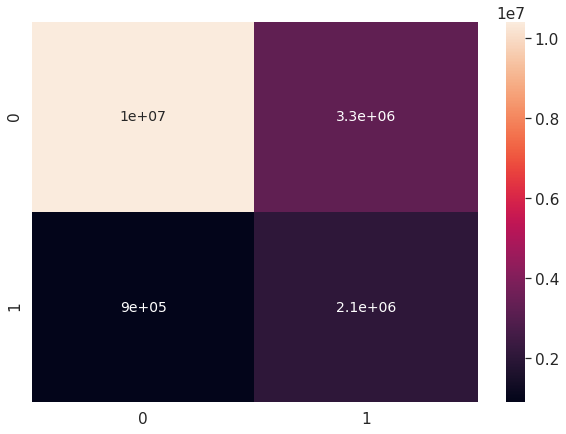

In [0]:
df_cm_train = pd.DataFrame(conf_mat_train, range(2), range(2))
plt.figure(figsize=(10,7))
sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm_train, annot=True, annot_kws={"size": 14}) # font size


# |TN FN|
# |FP TP|
plt.show()

##### Validation Analysis

In [0]:
y_val_true = valScoreAndLabels_pd["label"]
y_val_pred = valScoreAndLabels_pd["raw"]
conf_mat_val = confusion_matrix(y_val_true, y_val_pred)

In [0]:
print("Accuracy Score: ", accuracy_score(y_val_true, y_val_pred))
print("F1 Score: ", f1_score(y_val_true, y_val_pred))
print(classification_report(y_val_true, y_val_pred))

Accuracy Score: 0.7237838407968141
F1 Score: 0.4043244599035813
 precision recall f1-score support

 0.0 0.88 0.77 0.82 5730843
 1.0 0.33 0.51 0.40 1285097

 accuracy 0.72 7015940
 macro avg 0.60 0.64 0.61 7015940
weighted avg 0.78 0.72 0.74 7015940

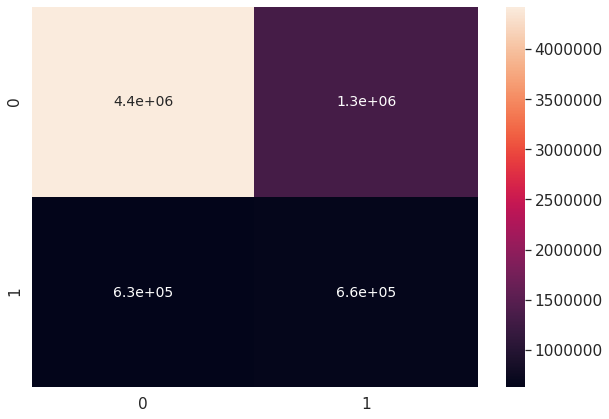

In [0]:
df_cm_val = pd.DataFrame(conf_mat_val, range(2), range(2))
plt.figure(figsize=(10,7))
sn.set(font_scale=1.4) # for label size
sn.heatmap(df_cm_val, annot=True, annot_kws={"size": 14}) # font size


# |TN FN|
# |FP TP|
plt.show()